In [1]:
import spacy
import re
import json
import os
import pandas as pd
from collections import Counter

from ai_news_detector.features.pos import pos_per_word, UD_TAGS, all_pos_per_word
from ai_news_detector.features.punctuation import punctuation_per_letter, punctuation_per_word
from ai_news_detector.features.text_stats import avg_sentence_len, capital_ratio, ttr, ttr_lemmatized
from ai_news_detector.features.syllables import avg_syllables_per_sentence, avg_word_length

FOLDERS = [
    'gemini-2.5-flash',
    'gemini-3.1-flash-lite-preview',
    'gemini-3-flash-preview',
    'gpt-oss-120b',
    'llama-3.3-70b-instruct-fp8-fast',
    'nemotron-3-120b-a12b'
]

def preprocess_for_bert(text: str) -> str:
    text = re.sub(r'\*+', '', text)
    text = re.sub(r'^\d+\.\s*|-\s*', '', text, flags=re.MULTILINE)
    text = re.sub(r'\s+', ' ', text)
    return text.strip()

def build_popularity_dictionary(texts: list, labels: list, nlp) -> dict:
    print("\n--- Building Basic Popularity Dictionary ---")
    # label == 0 implies human text
    human_texts = [text for text, label in zip(texts, labels) if label == 0]
    word_counts = Counter()
    
    for doc in nlp.pipe(human_texts, disable=["parser", "ner"]):
        for token in doc:
            if not token.is_stop and not token.is_punct and not token.is_space and token.is_alpha:
                word_counts[token.lemma_.lower()] += 1
                
    if not word_counts:
        return {}
        
    max_count = max(word_counts.values())
    popularity_dict = {word: count / max_count for word, count in word_counts.items()}
    
    print(f"Dictionary built with {len(popularity_dict)} unique lemmas.")
    return popularity_dict

def get_popularity_scores(texts: list, popularity_dict: dict, nlp) -> list:
    """Helper to calculate popularity score array for a DataFrame column."""
    scores = []
    for doc in nlp.pipe(texts, disable=["parser", "ner"]):
        valid_words_count = 0
        total_score = 0.0
        
        for token in doc:
            if not token.is_stop and not token.is_punct and not token.is_space and token.is_alpha:
                lemma = token.lemma_.lower()
                total_score += popularity_dict.get(lemma, 0.0)
                valid_words_count += 1
                
        pop_index = total_score / valid_words_count if valid_words_count > 0 else 0.0
        scores.append(pop_index)
    return scores

def load_data_to_dataframe(
    dataset_path: str, 
    samples_per_llm: int = 500,
    use_stylistic_features: bool = True, 
    basic_popularity_index: bool = True, 
    wiki_popularity_index: bool = True, 
    nkjp_popularity_index: bool = True, 
    normalize_nkjp: bool = True, 
    wiki_dict_path: str = "wiki_popularity_dict.json", 
    nkjp_dict_path: str = "nkjp_popularity_dict.json"
) -> pd.DataFrame:
    
    all_data = []
    required_ids = set()

    # ---------------------------------------------------------
    # 1. LOAD LLM DATA (Label 1)
    # ---------------------------------------------------------
    print(f"Loading LLM Data (Target: {samples_per_llm} samples per model)...")
    for folder in FOLDERS:
        folder_path = os.path.join(dataset_path, folder)
        if not os.path.exists(folder_path):
            print(f"Warning: Folder {folder} not found, skipping.")
            continue
            
        files = sorted(os.listdir(folder_path))
        loaded_count = 0
        
        for file in files:
            if loaded_count >= samples_per_llm:
                break
                
            file_id = int(file.split('.')[0])
            with open(os.path.join(folder_path, file), 'r', encoding='utf-8') as f:
                data = json.load(f)
                
            texts = [sentence.strip() for sentence in data.get('Wygenerowany tekst', '').split('\n\n')]
            
            for t in texts:
                if len(t.split(' ')) < 15:
                    continue 
                if loaded_count >= samples_per_llm:
                    break 
                    
                all_data.append({
                    'id': file_id,
                    'text': preprocess_for_bert(t),
                    'is_llm': 1,
                    'source': folder
                })
                required_ids.add(file_id)
                loaded_count += 1

    # ---------------------------------------------------------
    # 2. LOAD HUMAN DATA (Label 0)
    # ---------------------------------------------------------
    print(f"Loading matched Human Data (from {len(required_ids)} unique IDs)...")
    human_path = os.path.join(dataset_path, 'scraped_news.json')
    with open(human_path, 'r', encoding='utf-8') as f:
        human_news = json.load(f)
        
    for row in human_news:
        file_id = row.get('id')
        if file_id in required_ids:
            texts = [sentence.strip() for sentence in row.get('body', '').split('\n\n')]
            for t in texts:
                if len(t.split(' ')) < 15:
                    continue
                
                all_data.append({
                    'id': file_id,
                    'text': preprocess_for_bert(t),
                    'is_llm': 0,
                    'source': 'Human'
                })

    # Convert raw collections to DataFrame
    df = pd.DataFrame(all_data)
    print(f"Total samples collected: {len(df)} (LLM: {len(df[df['is_llm'] == 1])}, Human: {len(df[df['is_llm'] == 0])})")

    # ---------------------------------------------------------
    # 3. APPLY STYLISTIC FEATURES
    # ---------------------------------------------------------
    if use_stylistic_features:
        print("\n--- Calculating Stylistic Features ---")
        stylistic_features = []
        for text in df['text']:
            feats = {}
            pos_ratios = all_pos_per_word(text)
            for pos in UD_TAGS:
                feats[f'pos_{pos}'] = pos_ratios.get(pos, 0)
                
            feats['punct_per_letter'] = punctuation_per_letter(text)
            feats['punct_per_word'] = punctuation_per_word(text)
            feats['avg_sent_len'] = avg_sentence_len(text)
            feats['capital_ratio'] = capital_ratio(text)
            feats['ttr'] = ttr(text)
            feats['ttr_lemmatized'] = ttr_lemmatized(text)
            feats['avg_syllables_per_sent'] = avg_syllables_per_sentence(text)
            feats['avg_word_length'] = avg_word_length(text)
            
            stylistic_features.append(feats)
            
        df_stylistic = pd.DataFrame(stylistic_features)
        df = pd.concat([df, df_stylistic], axis=1)

    # ---------------------------------------------------------
    # 4. APPLY POPULARITY INDICES
    # ---------------------------------------------------------
    if basic_popularity_index or wiki_popularity_index or nkjp_popularity_index:
        print("\nLoading Polish NLP model for popularity indices...")
        nlp = spacy.load("pl_core_news_md")
        texts_list = df['text'].tolist()

        if basic_popularity_index:
            print("Calculating Basic Popularity Index...")
            popularity_dict = build_popularity_dictionary(texts_list, df['is_llm'].tolist(), nlp)
            df['basic_popularity_index'] = get_popularity_scores(texts_list, popularity_dict, nlp)

        if wiki_popularity_index:
            print("Calculating Wikipedia Popularity Index...")
            with open(wiki_dict_path, "r", encoding="utf-8") as f:
                wiki_popularity_dict = json.load(f)
            df['wiki_popularity_index'] = get_popularity_scores(texts_list, wiki_popularity_dict, nlp)

        if nkjp_popularity_index:
            print("Calculating NKJP Popularity Index...")
            with open(nkjp_dict_path, "r", encoding="utf-8") as f:
                raw_nkjp_dict = json.load(f)
                
            if normalize_nkjp:
                byc_count = raw_nkjp_dict.get("być")
                if not byc_count or byc_count == 0:
                    byc_count = max(raw_nkjp_dict.values()) if raw_nkjp_dict else 1
                    norm_factor = 1.0
                else:
                    norm_factor = 0.1
                    
                nkjp_popularity_dict = {
                    word: (count / byc_count) * norm_factor 
                    for word, count in raw_nkjp_dict.items()
                }
            else:
                nkjp_popularity_dict = raw_nkjp_dict
                
            df['nkjp_popularity_index'] = get_popularity_scores(texts_list, nkjp_popularity_dict, nlp)

    # ---------------------------------------------------------
    # 5. CLEANUP
    # ---------------------------------------------------------
    # Drop the raw text column as requested, leaving only features and metadata
    df.drop(columns=['text'], inplace=True)
    
    return df

KeyboardInterrupt: 

In [6]:
df = load_data_to_dataframe(r'C:\Users\PC\OneDrive\Pulpit\projekty\ai-news-generator', wiki_dict_path=r'C:\Users\PC\OneDrive\Pulpit\projekty\ai-news-detector\wiki_popularity_dict.json', nkjp_dict_path=r'C:\Users\PC\OneDrive\Pulpit\projekty\ai-news-detector\nkjp_popularity_dict.json')

Loading LLM Data (Target: 500 samples per model)...
Loading matched Human Data (from 504 unique IDs)...
Total samples collected: 6802 (LLM: 2779, Human: 4023)

--- Calculating Stylistic Features ---

Loading Polish NLP model for popularity indices...
Calculating Basic Popularity Index...

--- Building Basic Popularity Dictionary ---
Dictionary built with 19452 unique lemmas.
Calculating Wikipedia Popularity Index...
Calculating NKJP Popularity Index...


In [10]:
df.to_parquet('eda.parquet')

In [1]:
import pandas as pd

df = pd.read_parquet('eda.parquet')

In [4]:
df.shape

(6802, 32)

In [6]:
df.columns

Index(['id', 'is_llm', 'source', 'pos_SPACE', 'pos_SYM', 'pos_DET', 'pos_ADJ',
       'pos_PART', 'pos_ADV', 'pos_NOUN', 'pos_CCONJ', 'pos_SCONJ',
       'pos_PUNCT', 'pos_PRON', 'pos_VERB', 'pos_AUX', 'pos_NUM', 'pos_PROPN',
       'pos_X', 'pos_ADP', 'pos_INTJ', 'punct_per_letter', 'punct_per_word',
       'avg_sent_len', 'capital_ratio', 'ttr', 'ttr_lemmatized',
       'avg_syllables_per_sent', 'avg_word_length', 'basic_popularity_index',
       'wiki_popularity_index', 'nkjp_popularity_index'],
      dtype='str')

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns

def make_plot(feature, x_lim=(0, None)):
    plt.figure(figsize=(10, 6))

    # Switch to histplot but turn on the KDE line
    ax = sns.histplot(
        data=df, 
        x=feature, 
        hue='is_llm',
        stat='percent',      # <--- This forces the Y-axis to literal percentages
        common_norm=False,   # <--- Ensures Human is 100% and LLM is 100% independently
        kde=True,            # <--- This draws the smooth KDE curve over the data
        fill=True, 
        alpha=0.4,
        palette={0: "red", 1: "blue"}
    )

    plt.title(f'Distribution of {feature} (%)', fontsize=14, fontweight='bold')
    plt.xlabel('Value')
    plt.ylabel('Percentage (%)')

    if ax.get_legend():
        sns.move_legend(ax, "upper right", title='Class', labels=['LLM (1)', 'Human (0)'])

    plt.grid(axis='y', alpha=0.3)

    # To prevent the chart from showing negative values on the x-axis, 
    # we set the limit here instead of using 'clip'
    plt.xlim(*x_lim) 
    plt.tight_layout()
    plt.show()

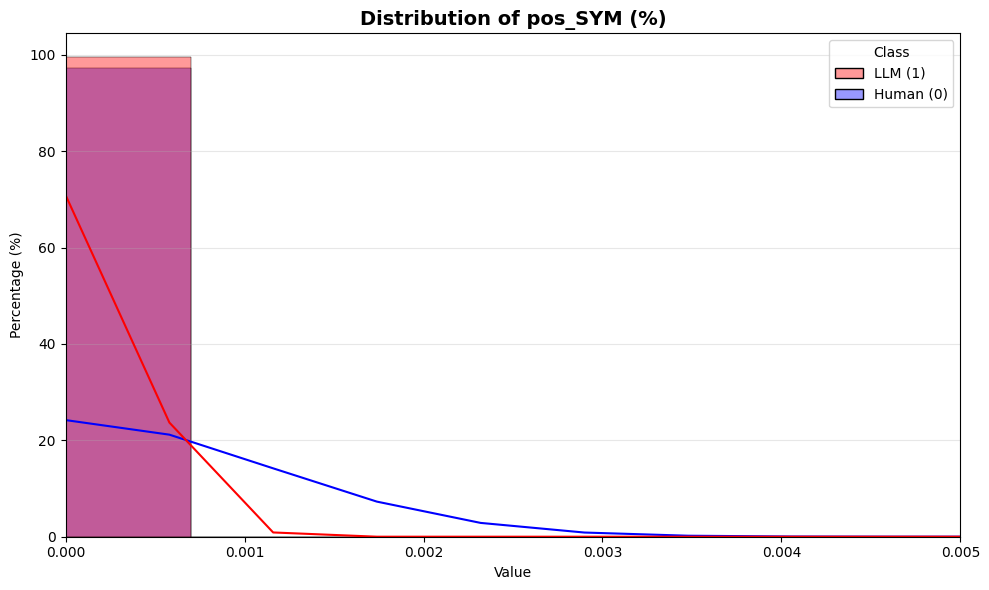

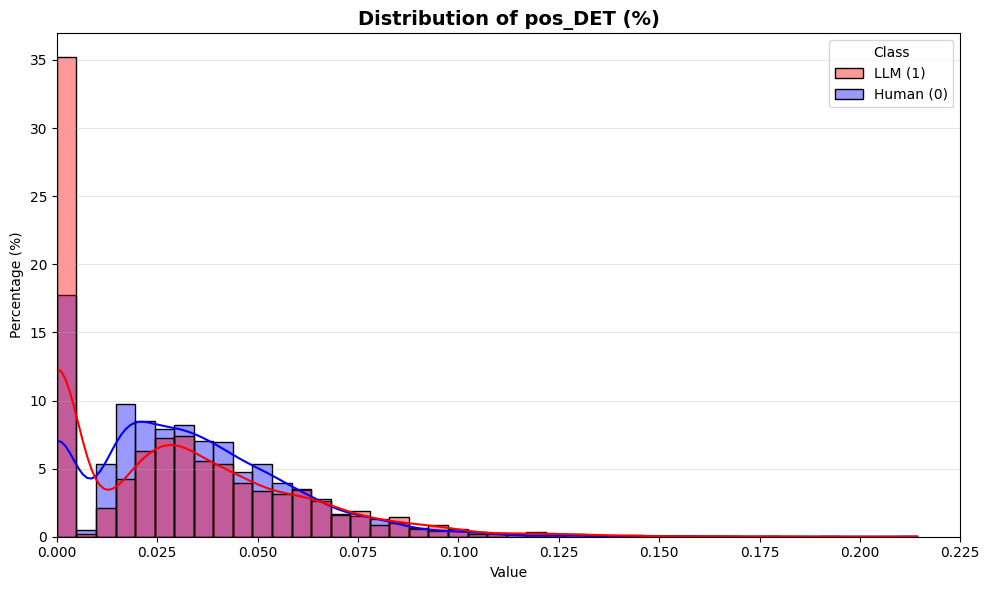

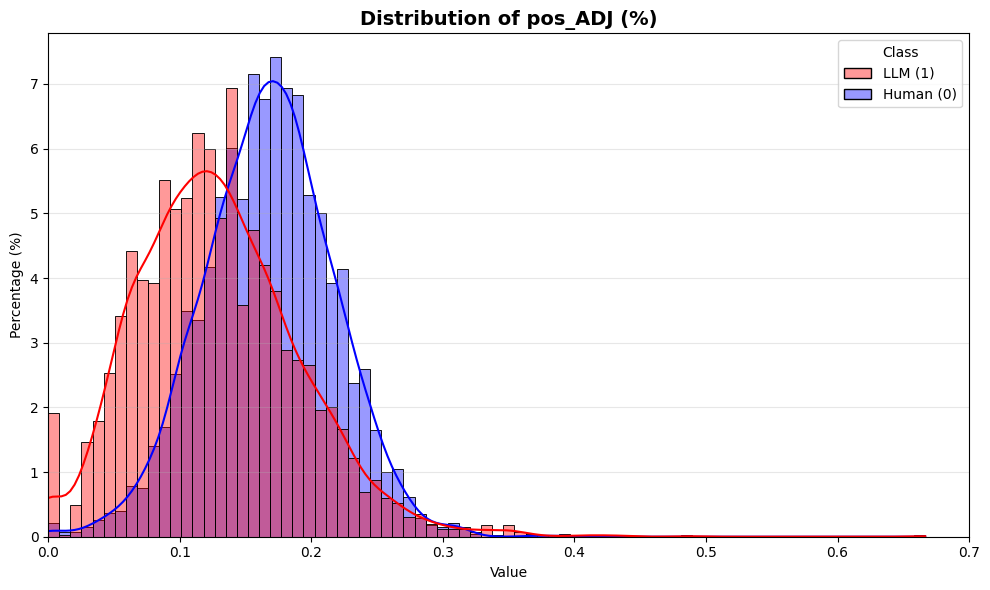

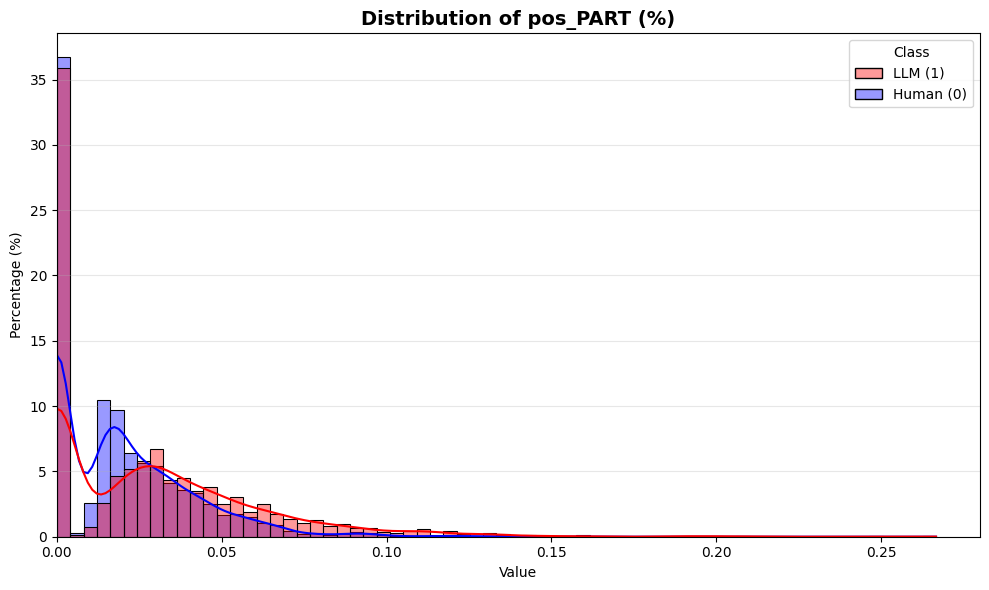

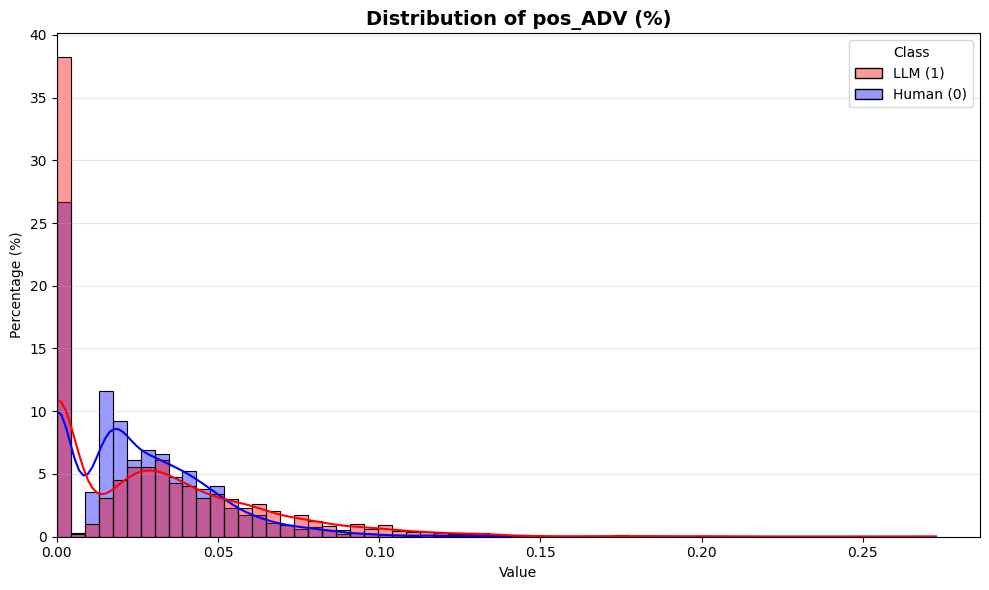

...

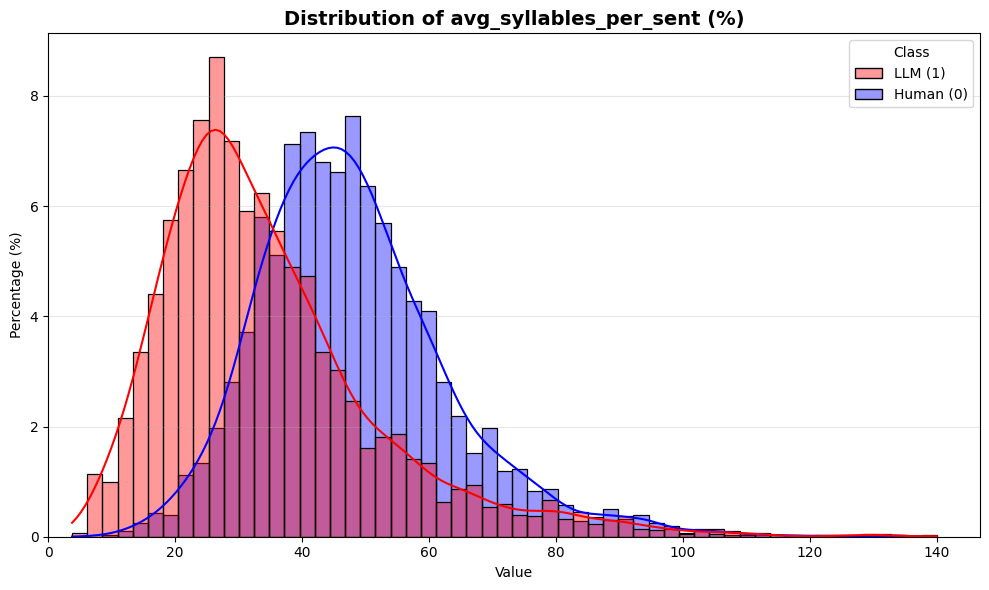

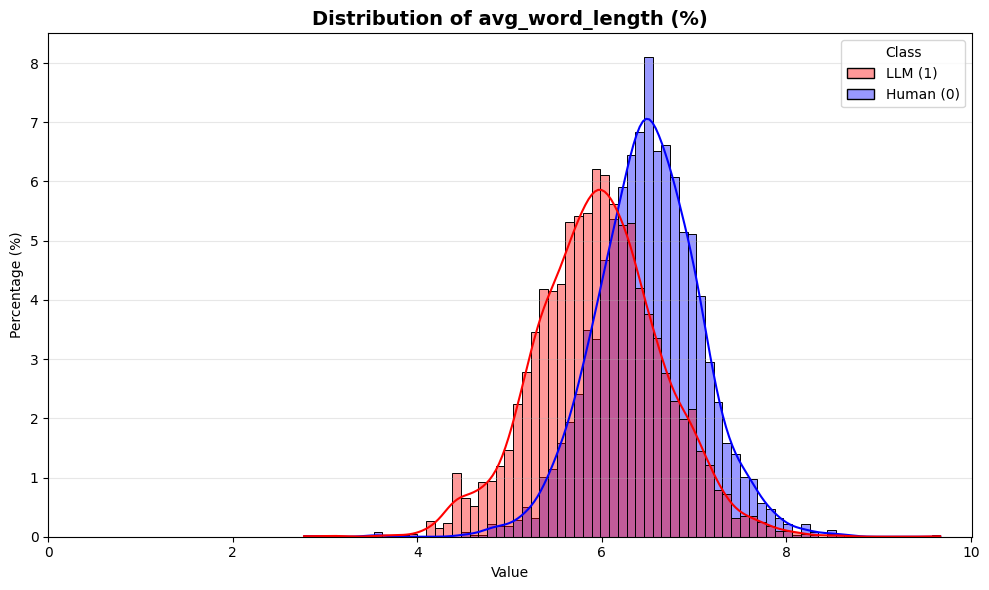

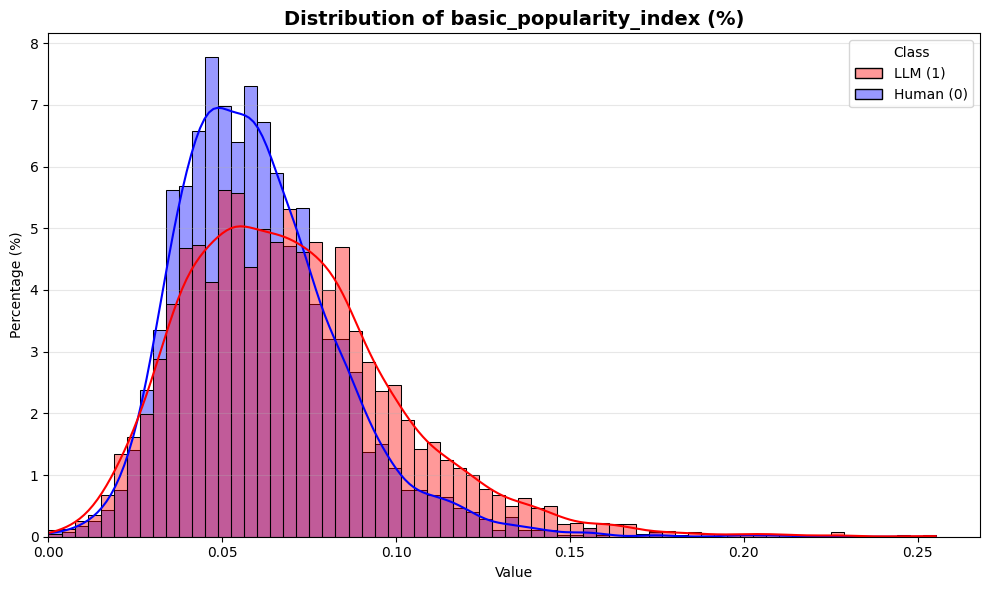

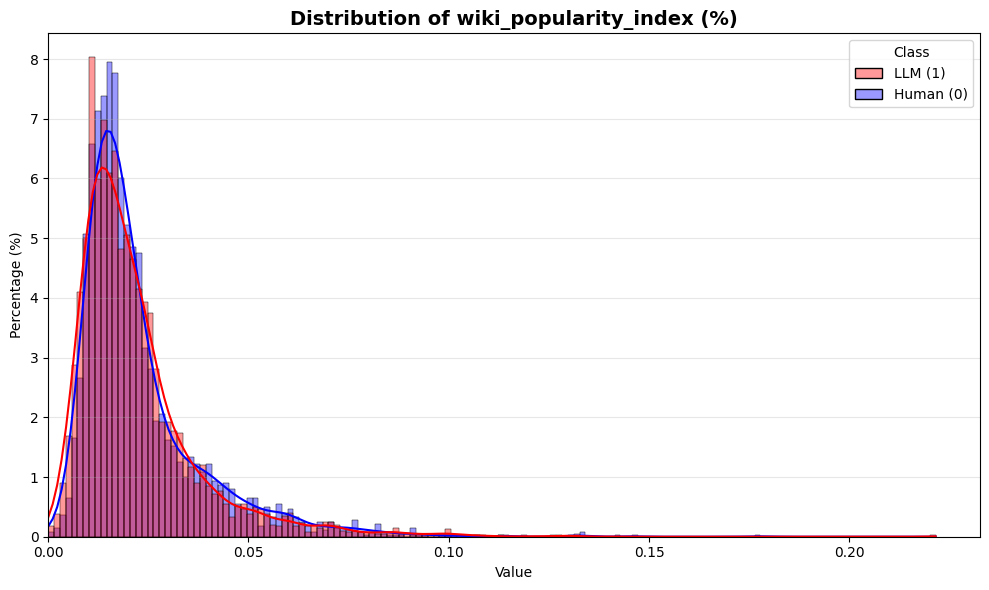

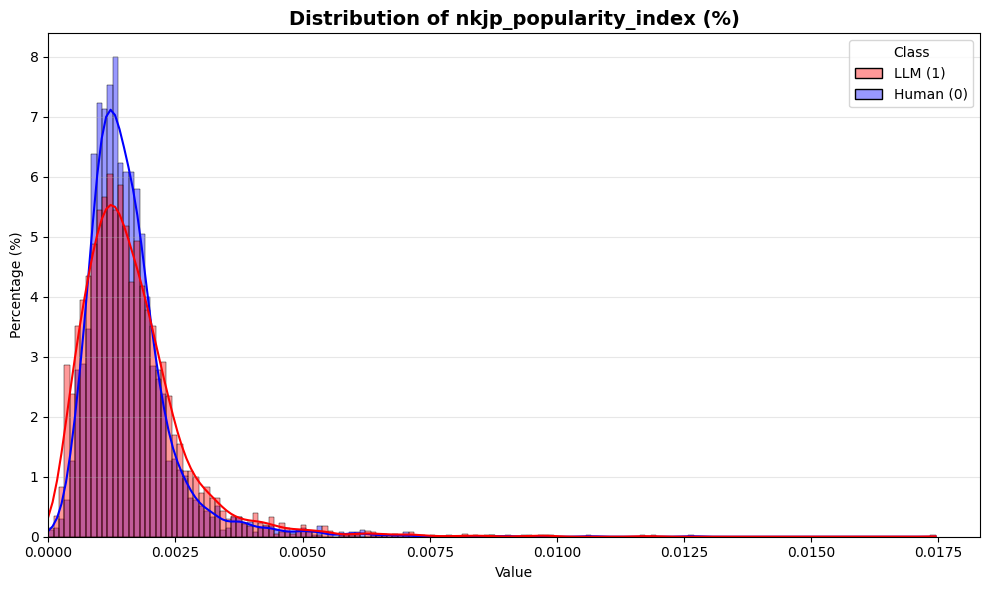

In [42]:
for column in df.columns[3:]:
    if column == 'pos_SPACE':
        continue
    if column == 'pos_SYM':
        make_plot('pos_SYM', (0, 0.005))
    else:
        make_plot(column)

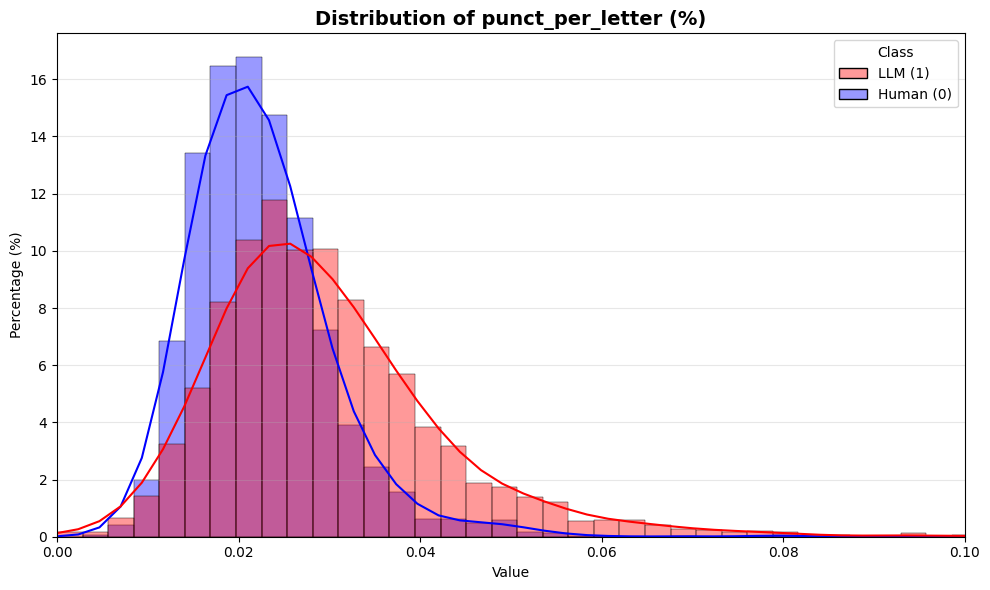

In [43]:
make_plot('punct_per_letter', (0, 0.1))

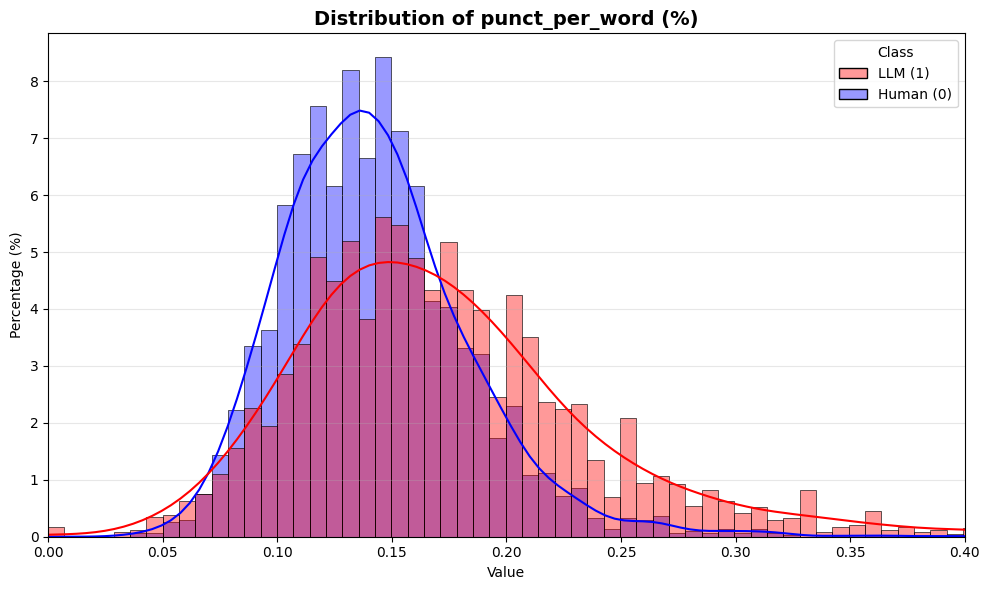

In [45]:
make_plot('punct_per_word', (0, 0.4))

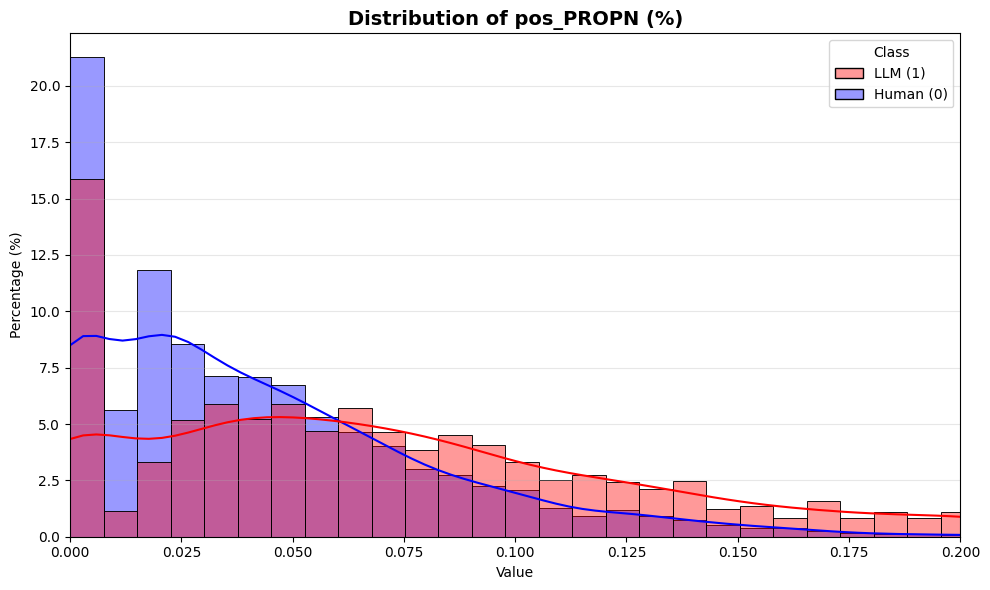

In [46]:
make_plot('pos_PROPN', (0, 0.2))

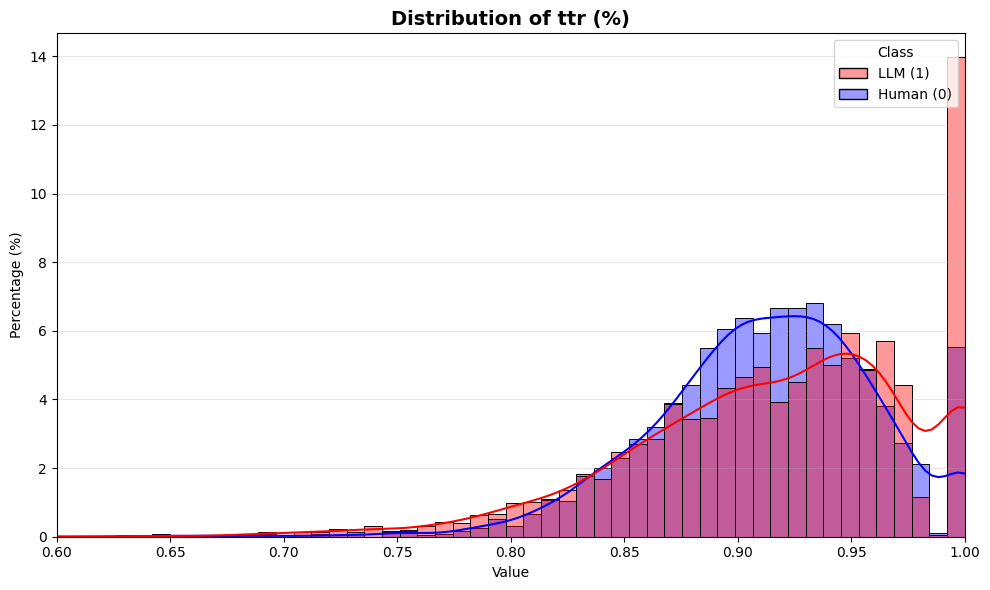

In [49]:
make_plot('ttr', (0.6, 1))

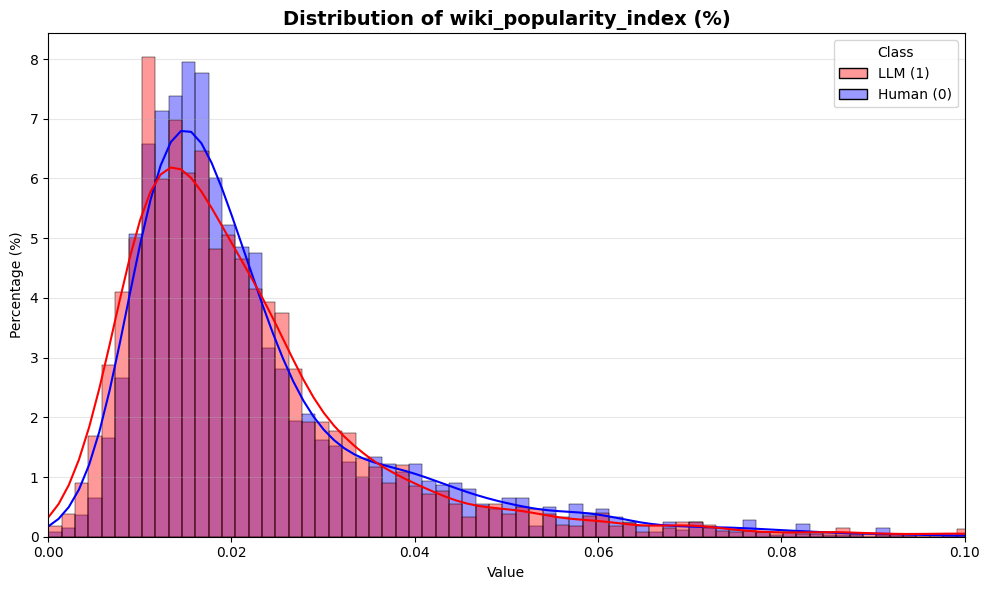

In [51]:
make_plot('wiki_popularity_index', (0.0, 0.1))

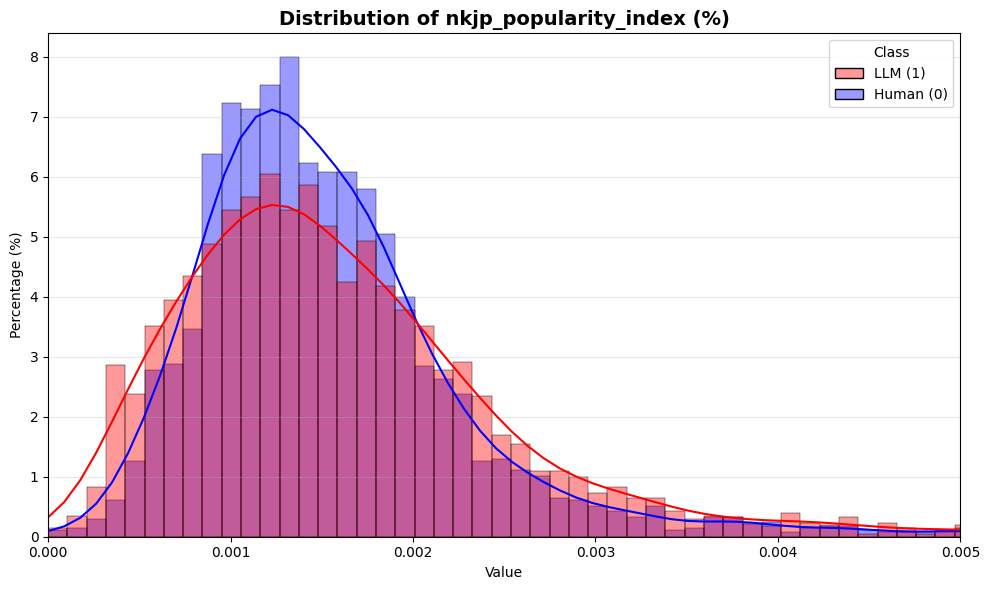

In [53]:
make_plot('nkjp_popularity_index', (0.0, 0.005))

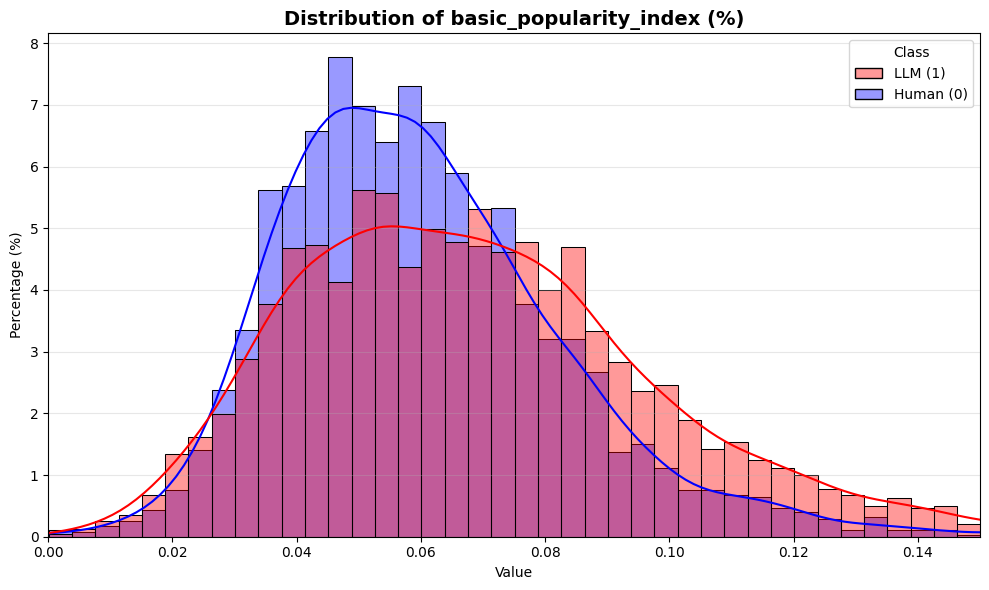

In [55]:
make_plot('basic_popularity_index', (0.0, 0.15))

In [5]:
df_source = df[
    (df['source'] == 'gemini-2.5-flash')
    | (
        (df['source'] == 'Human')
        & (df['id'].isin(df[df['source'] == 'gemini-2.5-flash']['id']))
    )]

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

def make_plot(df, feature, x_lim=(0, None)):
    plt.figure(figsize=(10, 6))

    # Switch to histplot but turn on the KDE line
    ax = sns.histplot(
        data=df, 
        x=feature, 
        hue='is_llm',
        stat='percent',      # <--- This forces the Y-axis to literal percentages
        common_norm=False,   # <--- Ensures Human is 100% and LLM is 100% independently
        kde=True,            # <--- This draws the smooth KDE curve over the data
        fill=True, 
        alpha=0.4,
        palette={0: "red", 1: "blue"}
    )

    plt.title(f'Distribution of {feature} (%)', fontsize=14, fontweight='bold')
    plt.xlabel('Value')
    plt.ylabel('Percentage (%)')

    if ax.get_legend():
        sns.move_legend(ax, "upper right", title='Class', labels=['LLM (1)', 'Human (0)'])

    plt.grid(axis='y', alpha=0.3)

    # To prevent the chart from showing negative values on the x-axis, 
    # we set the limit here instead of using 'clip'
    plt.xlim(*x_lim) 
    plt.tight_layout()
    plt.show()

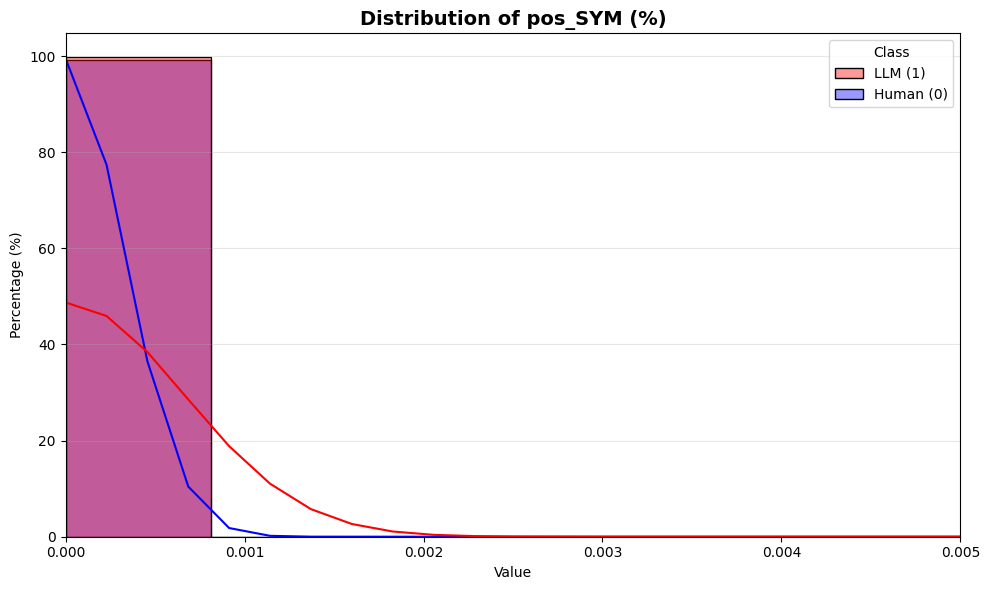

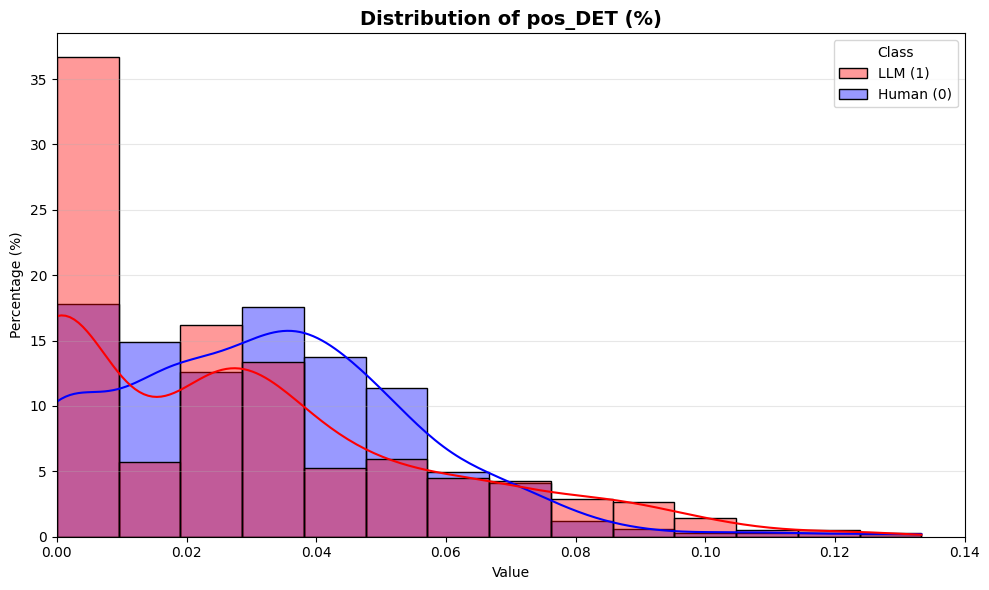

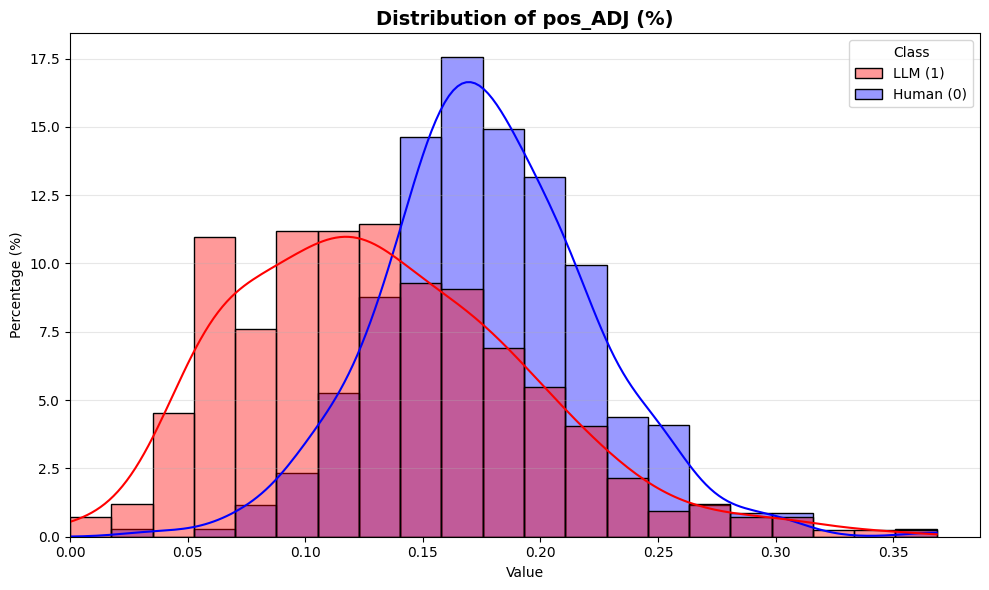

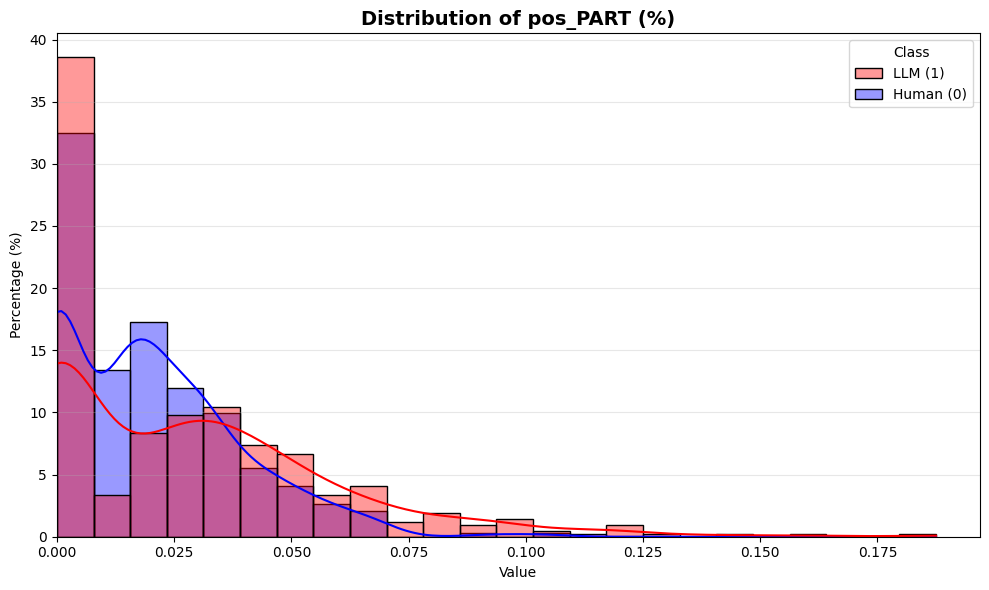

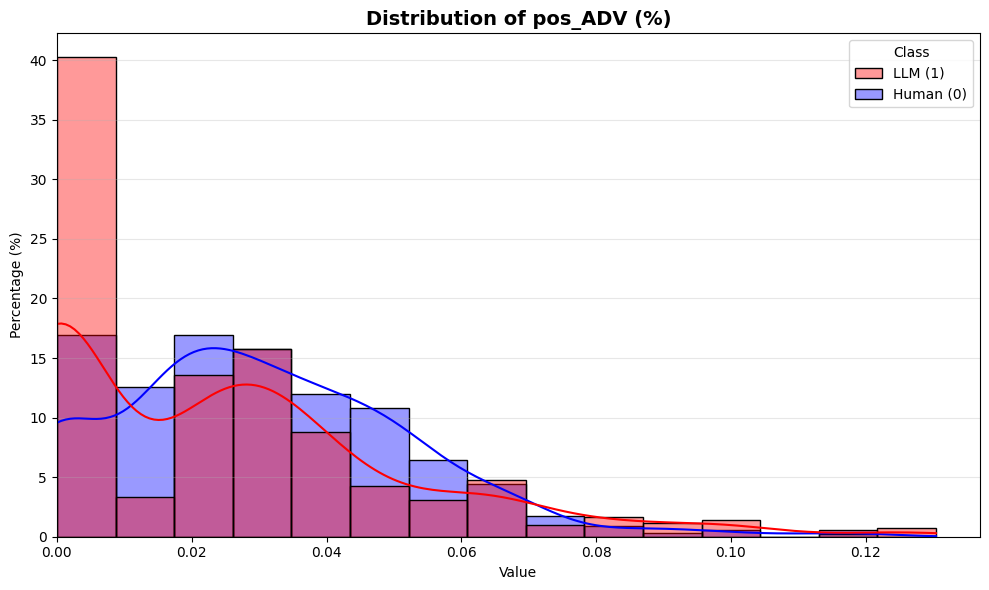

...

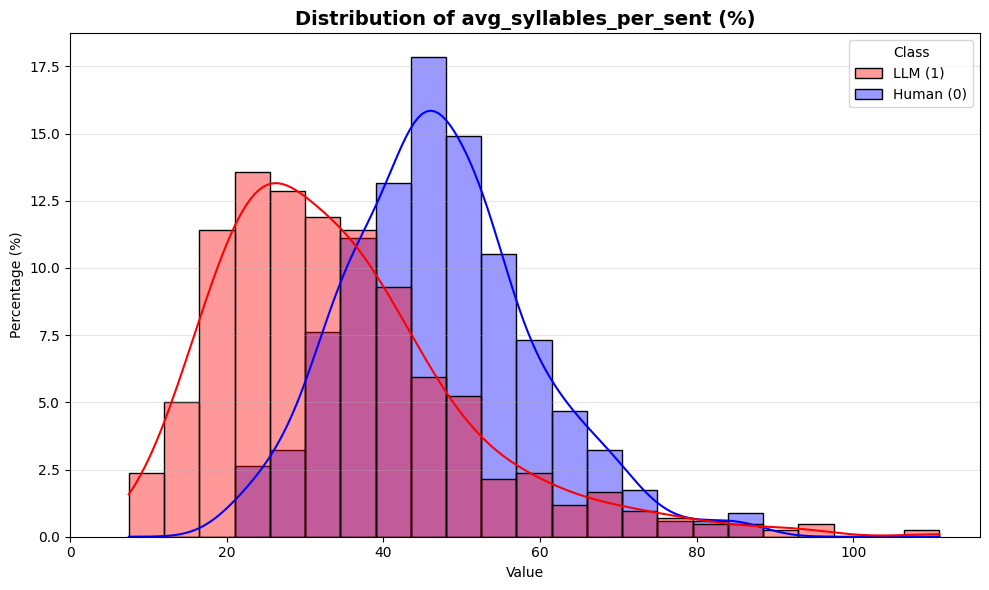

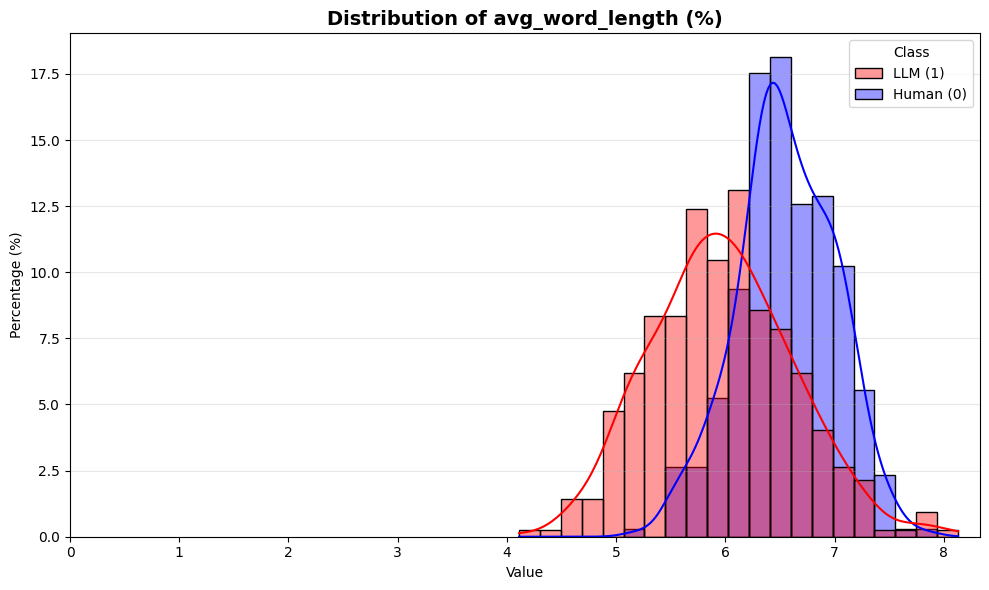

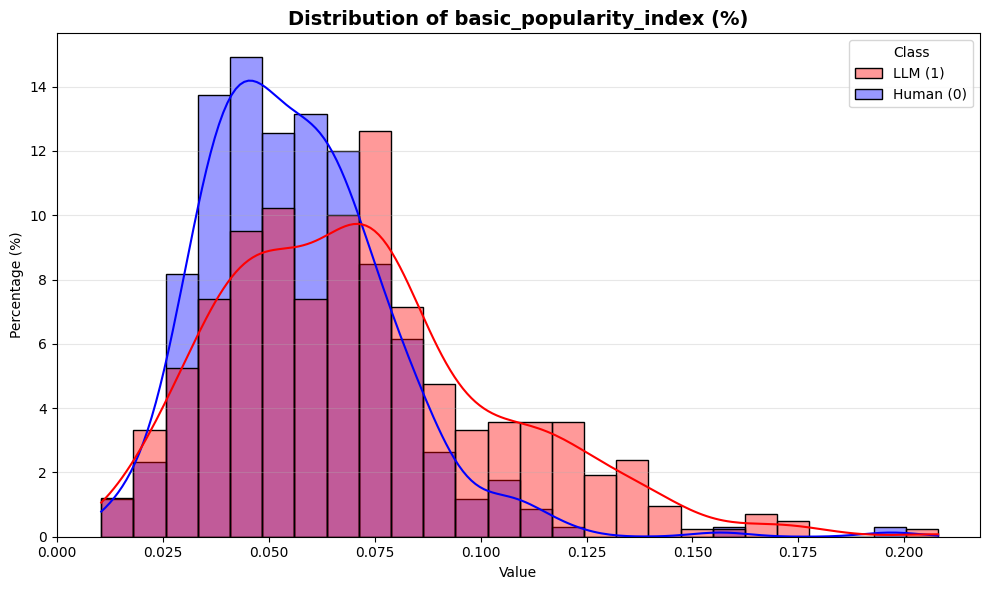

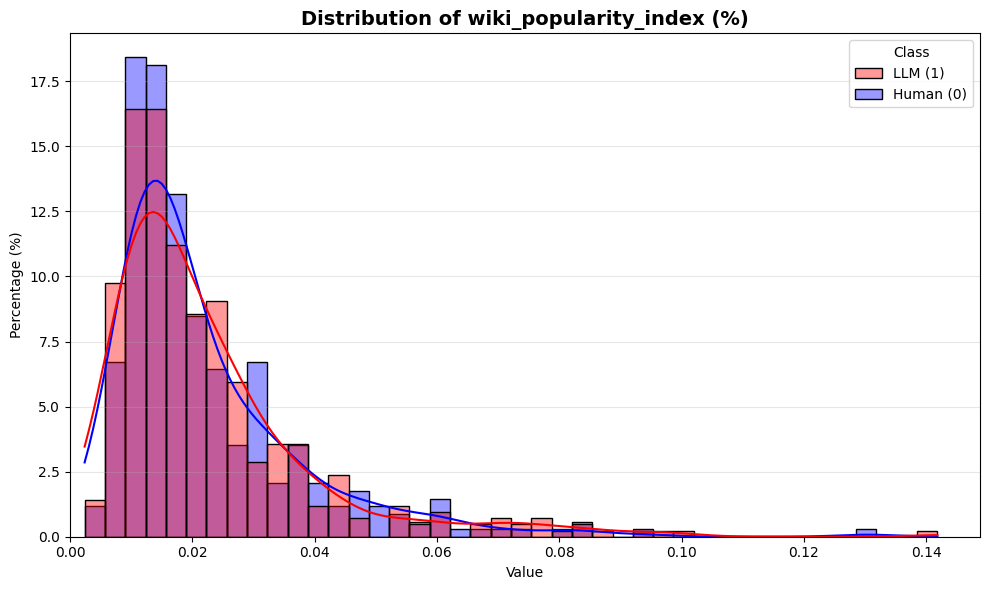

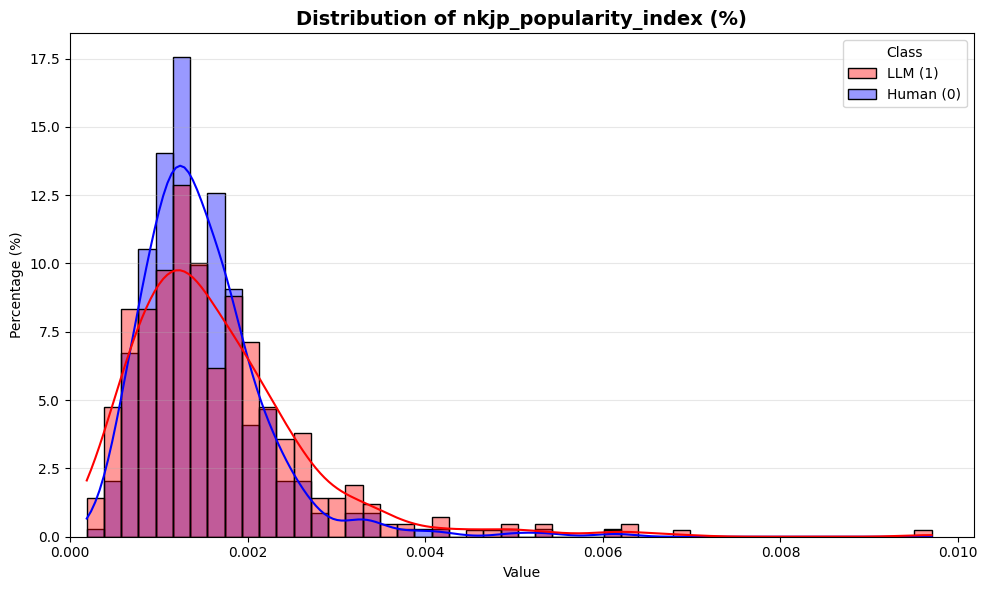

In [9]:
df_source = df[
    (df['source'] == 'gemini-2.5-flash')
    | (
        (df['source'] == 'Human')
        & (df['id'].isin(df[df['source'] == 'gemini-2.5-flash']['id']))
    )]
for column in df_source.columns[3:]:
    if column == 'pos_SPACE':
        continue
    if column == 'pos_SYM':
        make_plot(df_source, 'pos_SYM', (0, 0.005))
    else:
        make_plot(df_source, column)

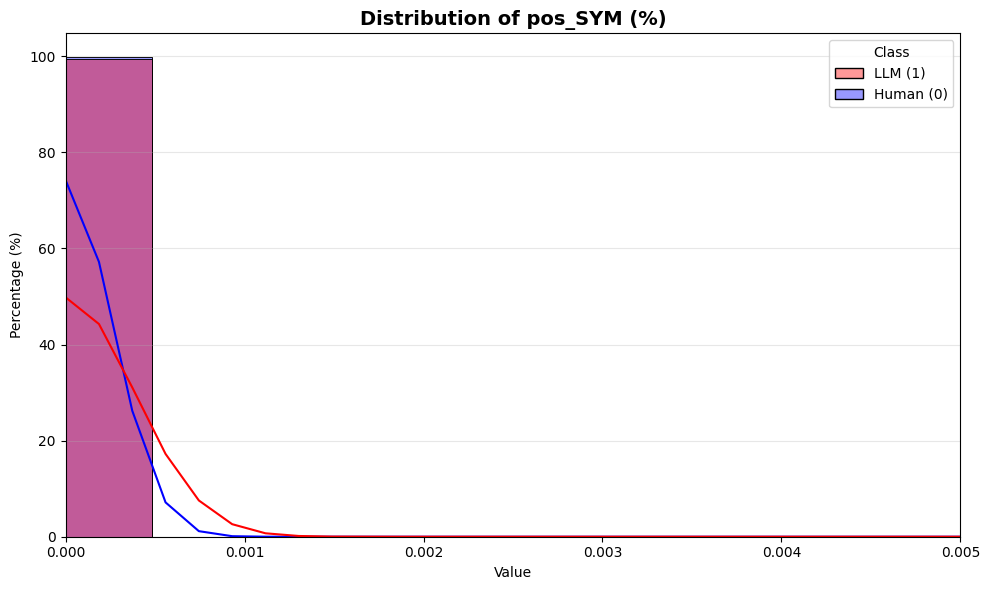

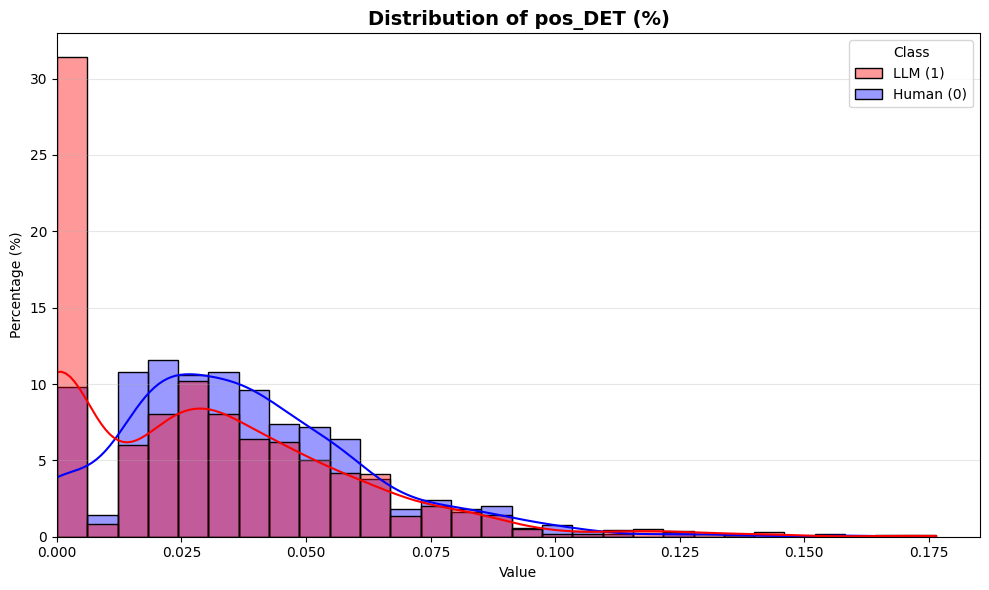

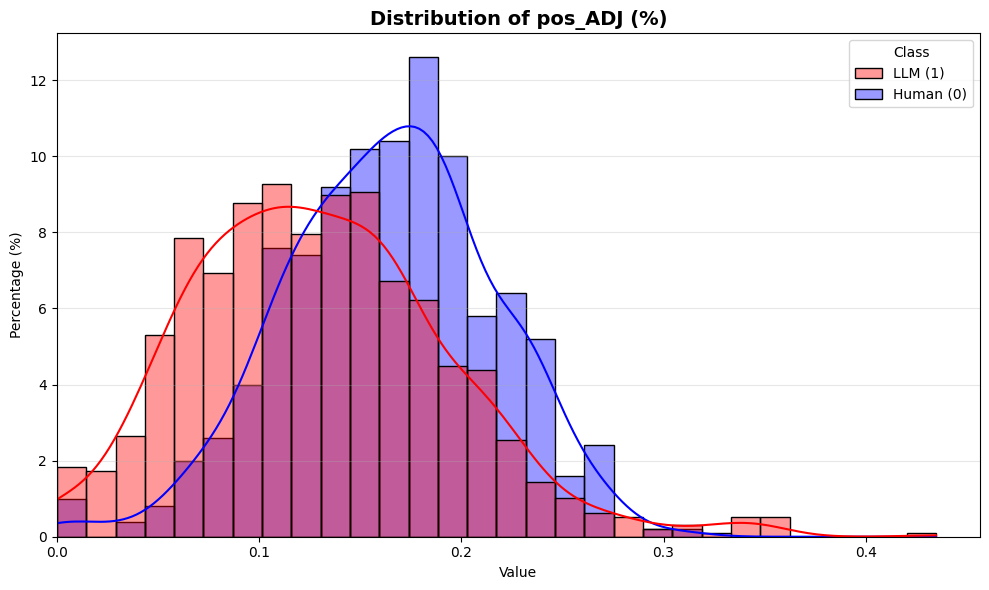

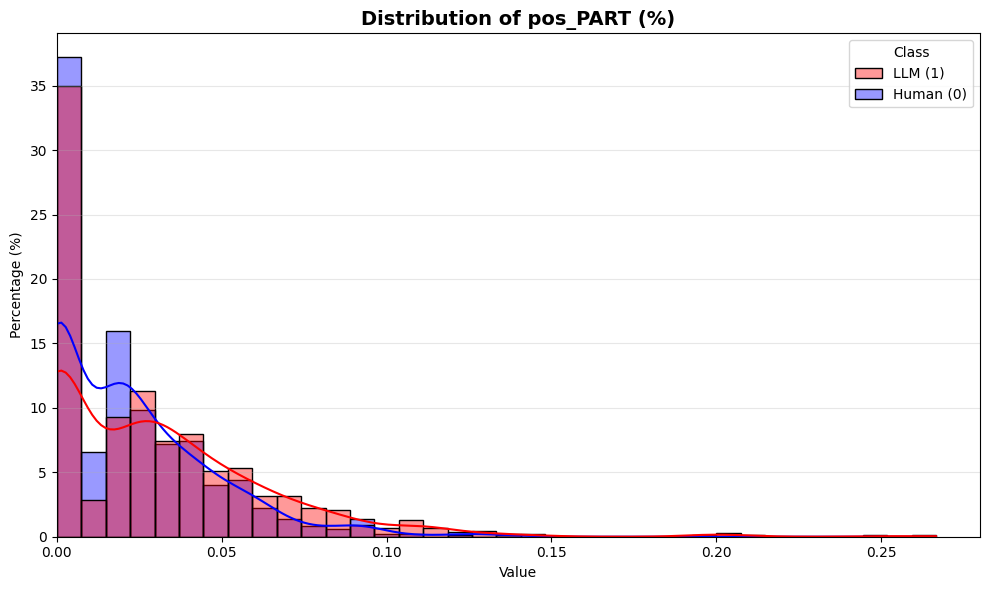

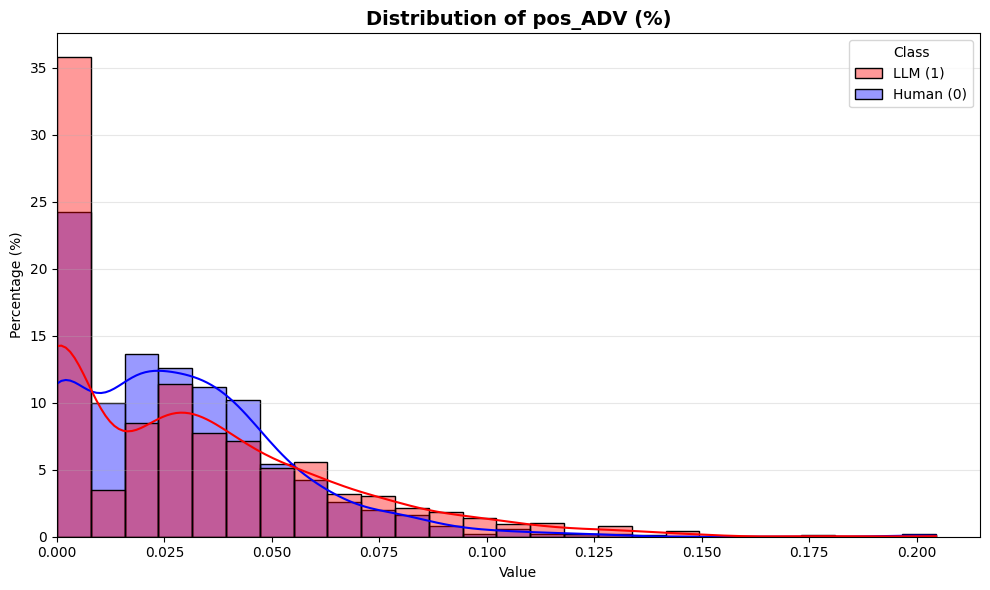

...

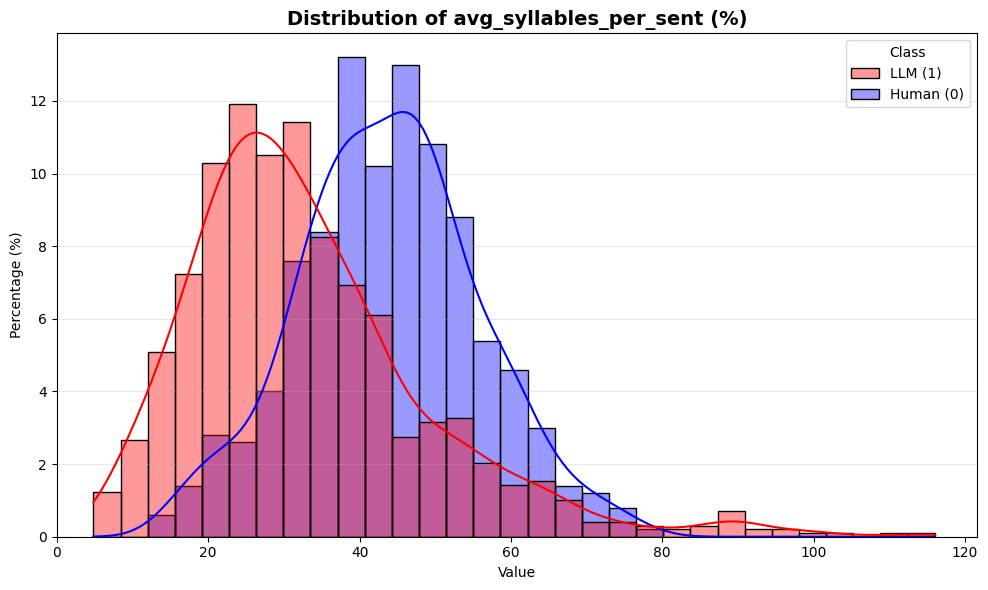

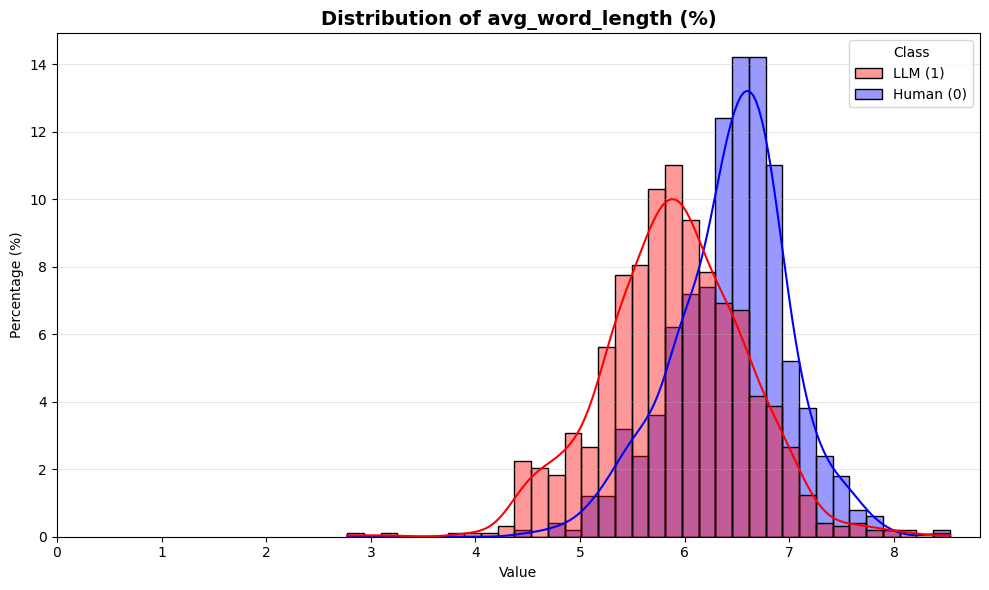

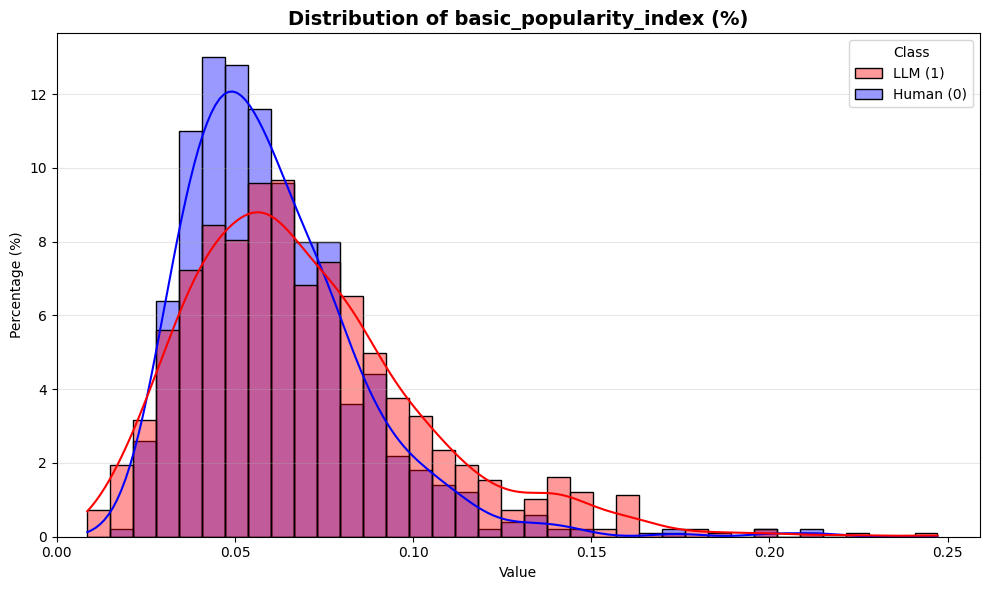

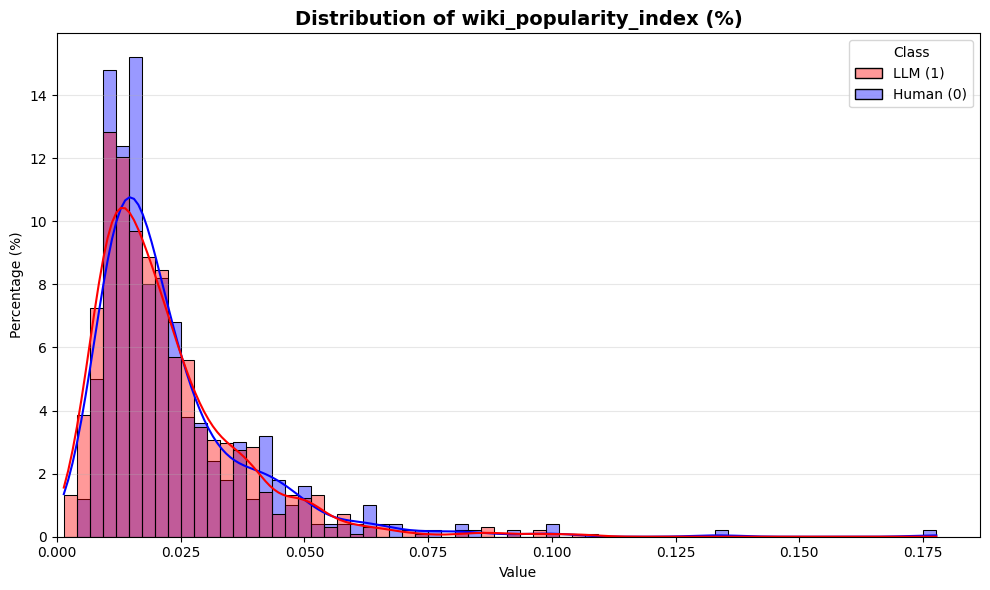

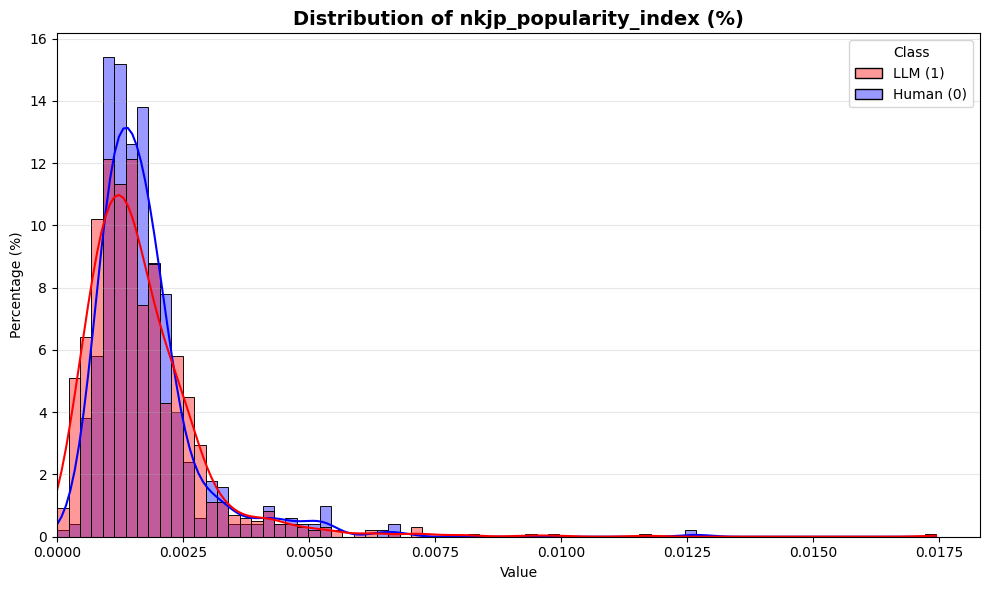

In [11]:
df_source = df[
    (df['source'] == 'gemini-3.1-flash-lite-preview')
    | (
        (df['source'] == 'Human')
        & (df['id'].isin(df[df['source'] == 'gemini-3.1-flash-lite-preview']['id']))
    )]
for column in df_source.columns[3:]:
    if column == 'pos_SPACE':
        continue
    if column == 'pos_SYM':
        make_plot(df_source, 'pos_SYM', (0, 0.005))
    else:
        make_plot(df_source, column)

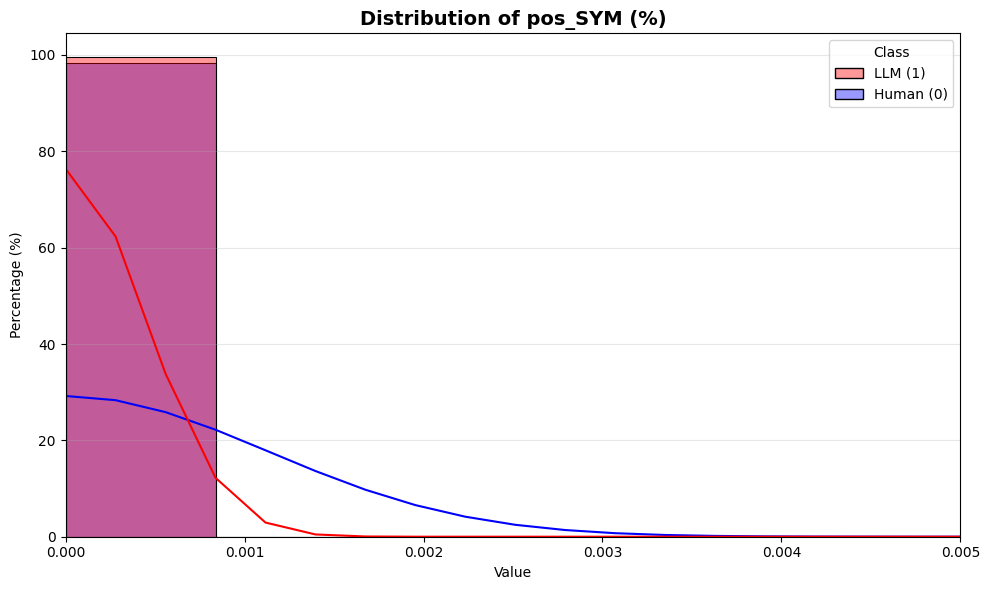

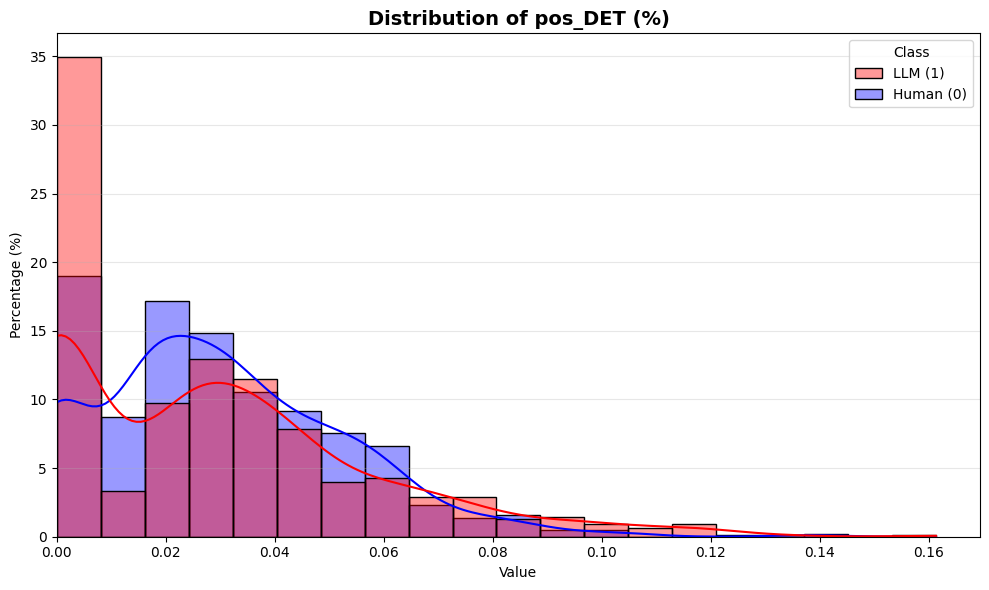

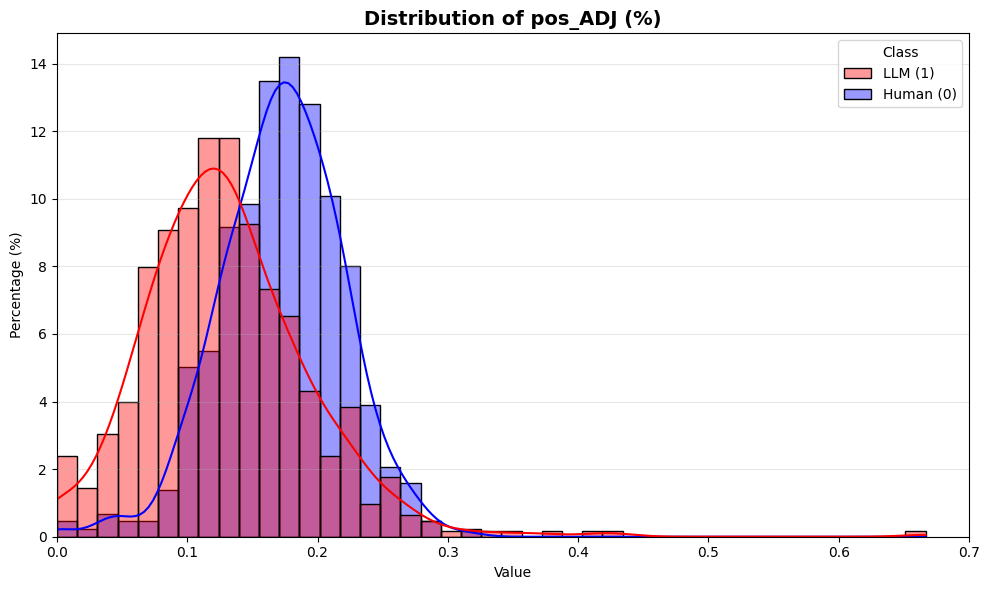

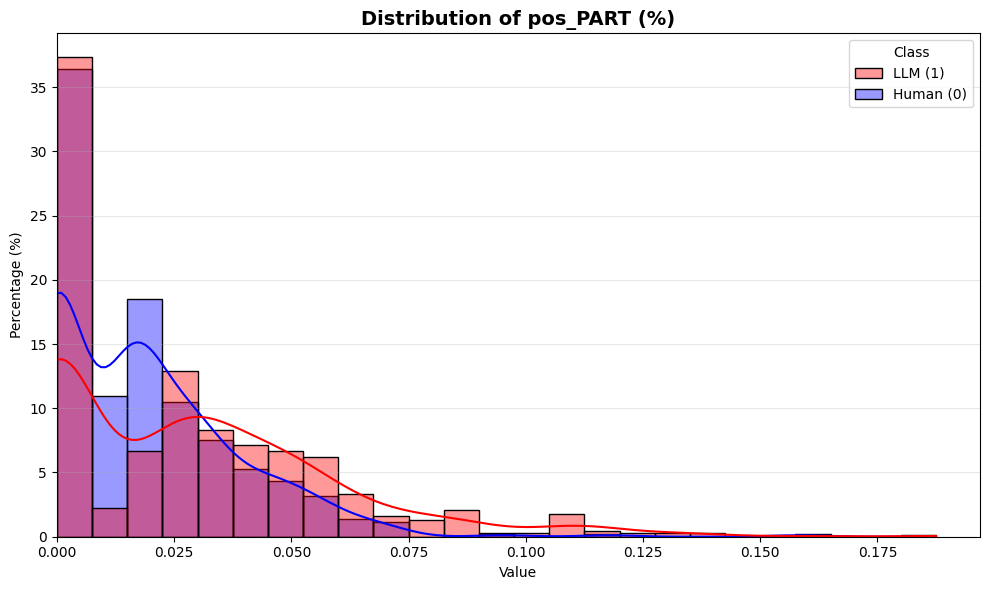

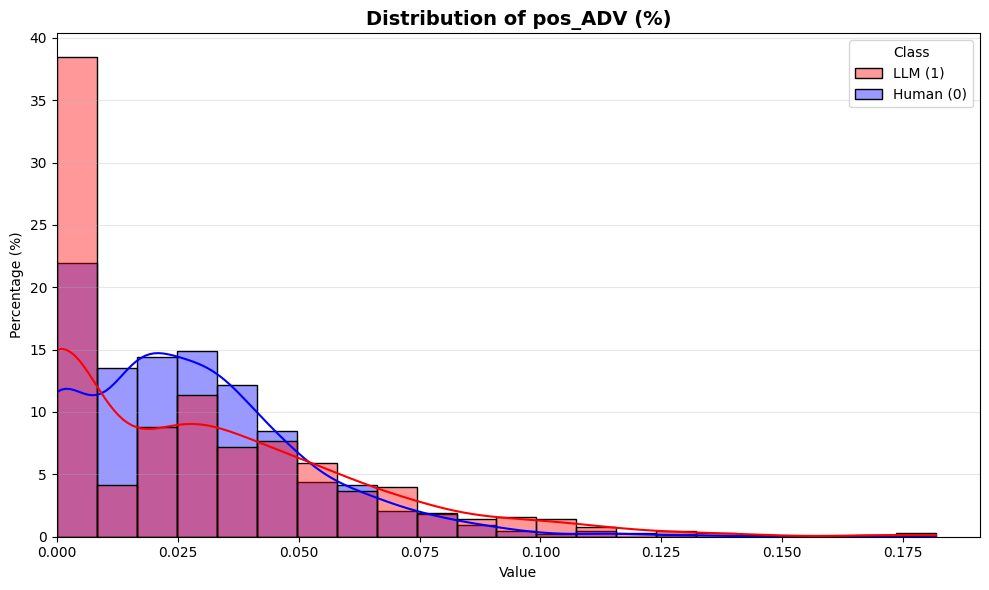

...

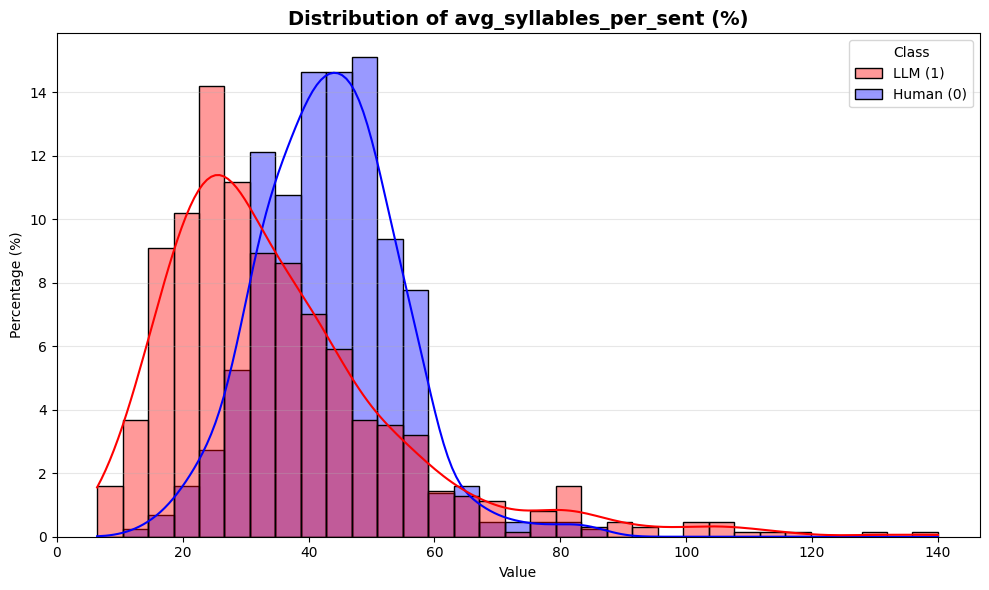

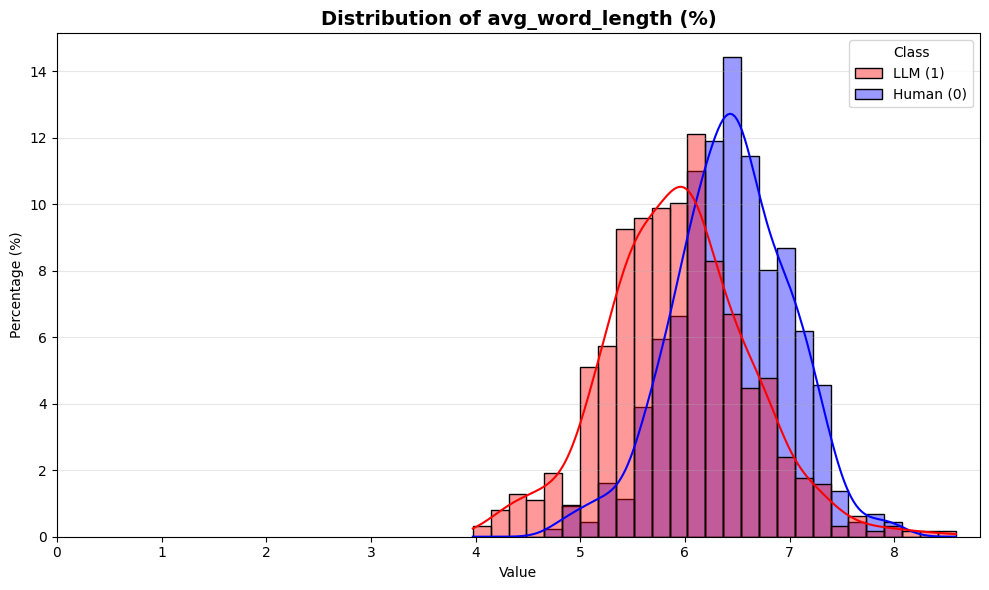

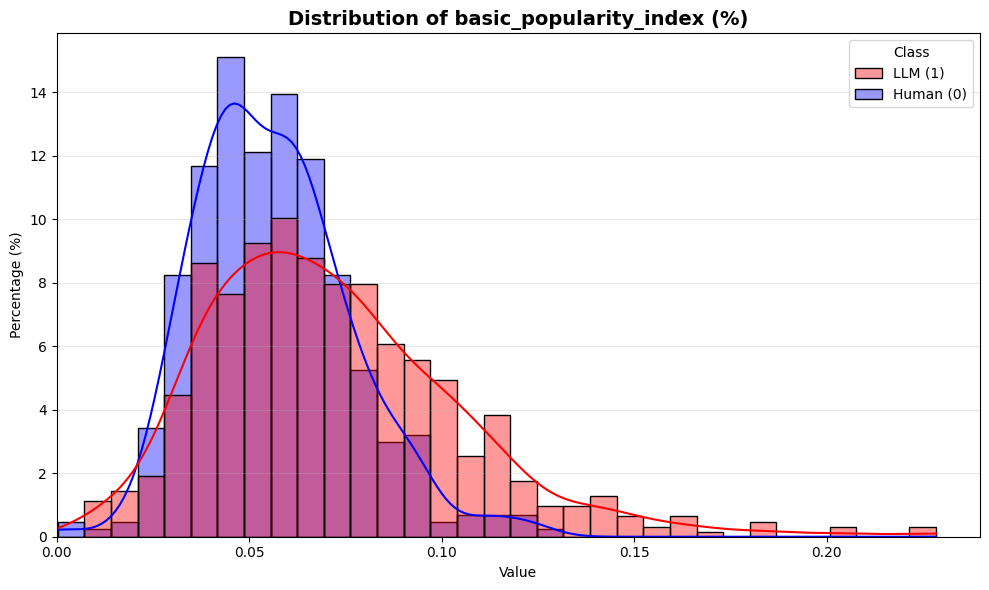

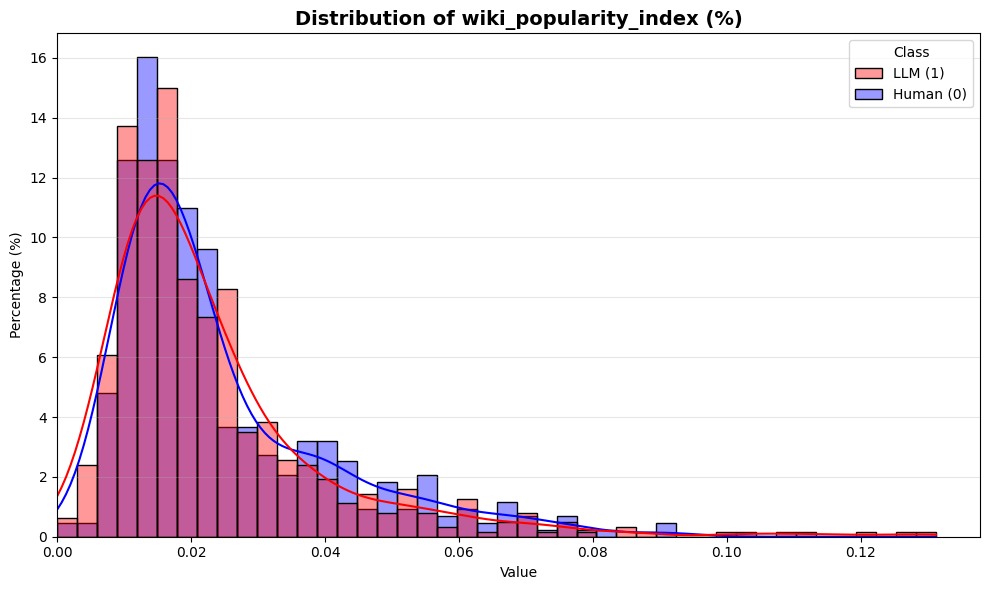

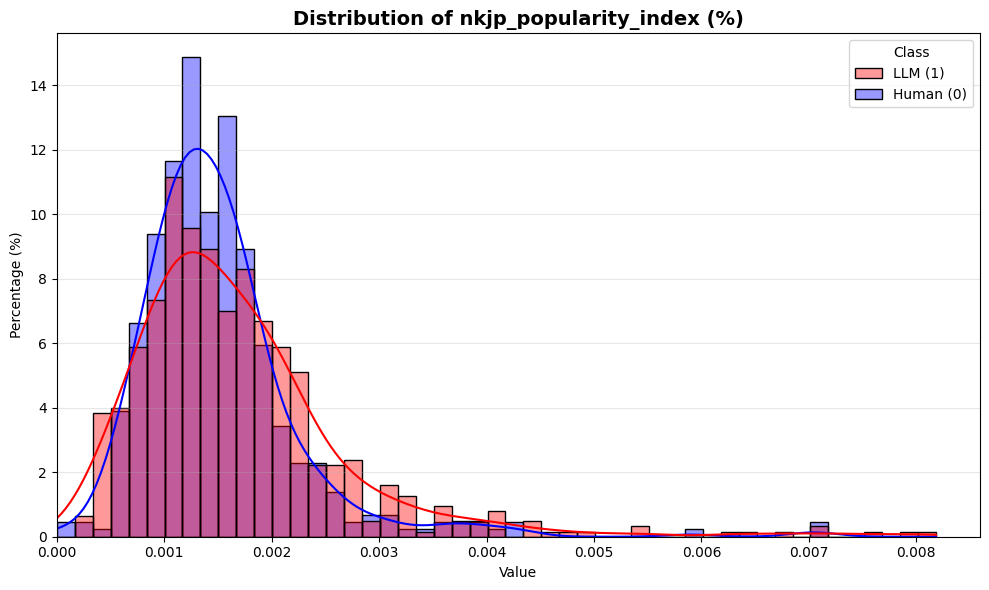

In [12]:
df_source = df[
    (df['source'] == 'gemini-3-flash-preview')
    | (
        (df['source'] == 'Human')
        & (df['id'].isin(df[df['source'] == 'gemini-3-flash-preview']['id']))
    )]
for column in df_source.columns[3:]:
    if column == 'pos_SPACE':
        continue
    if column == 'pos_SYM':
        make_plot(df_source, 'pos_SYM', (0, 0.005))
    else:
        make_plot(df_source, column)

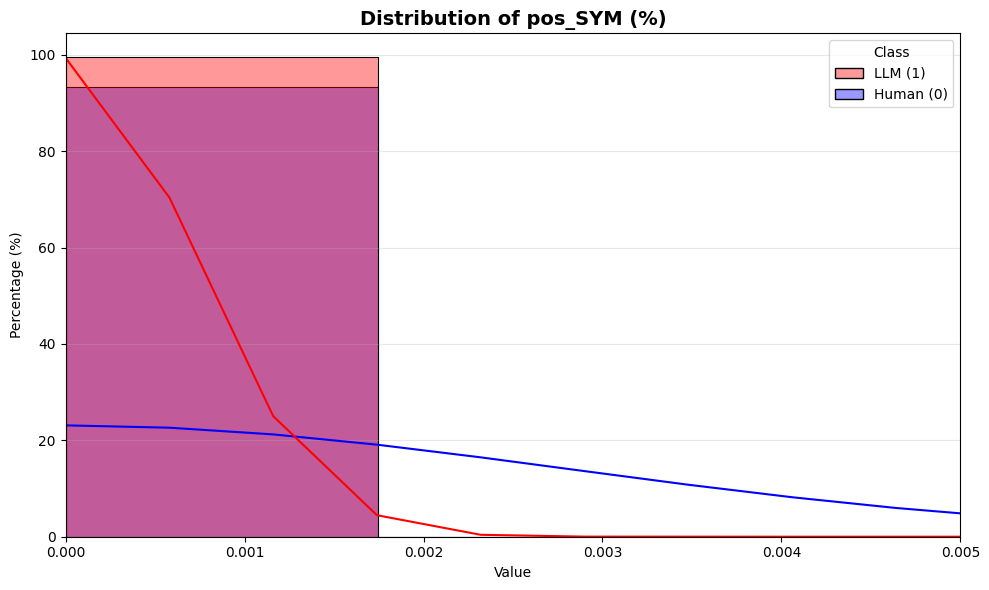

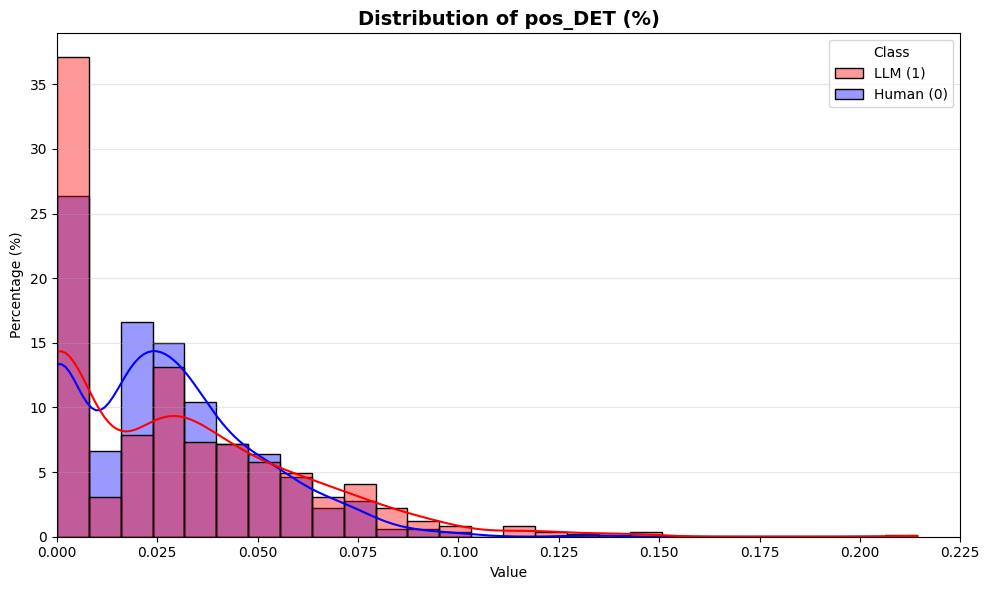

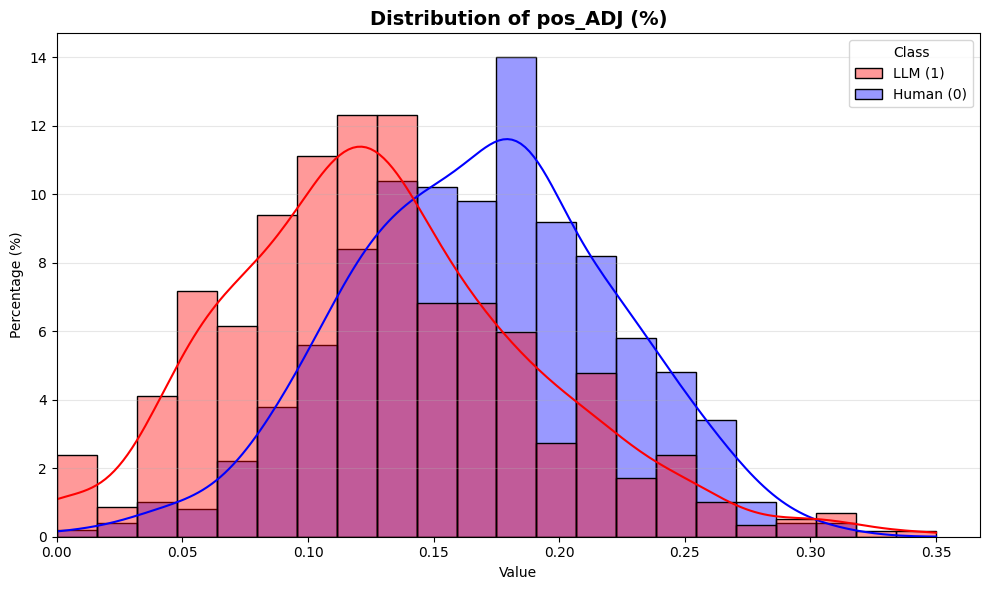

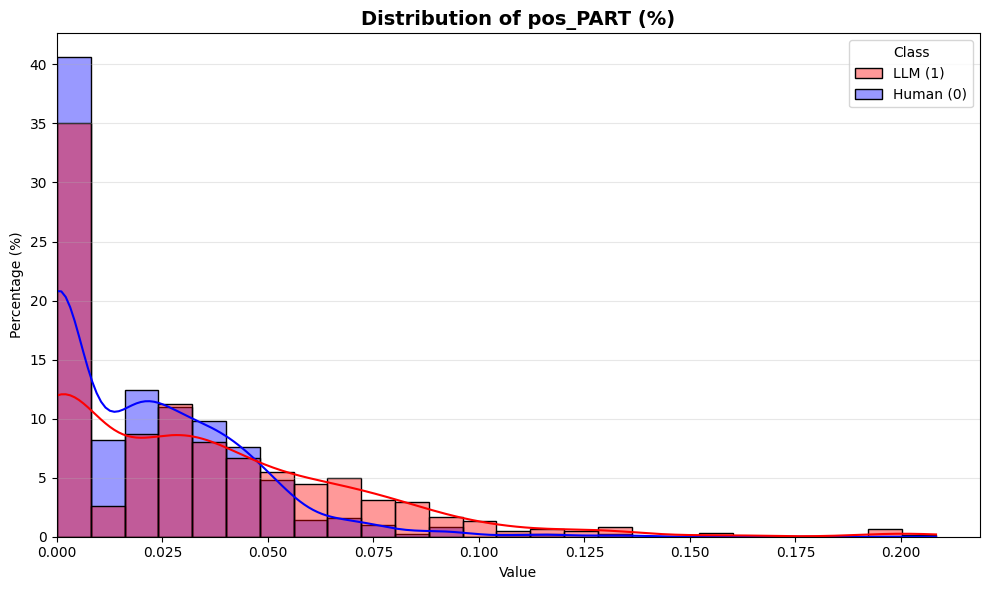

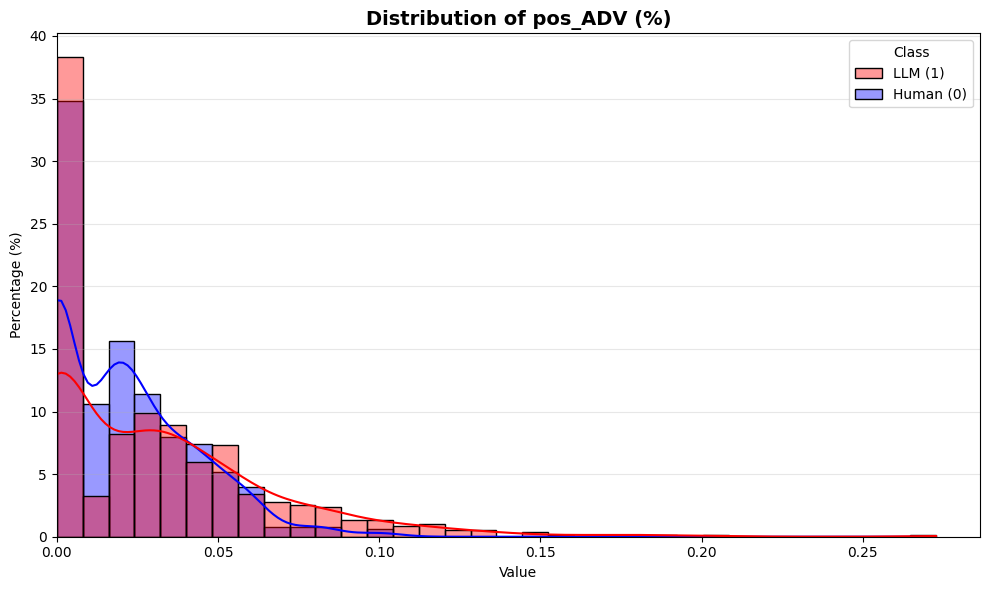

...

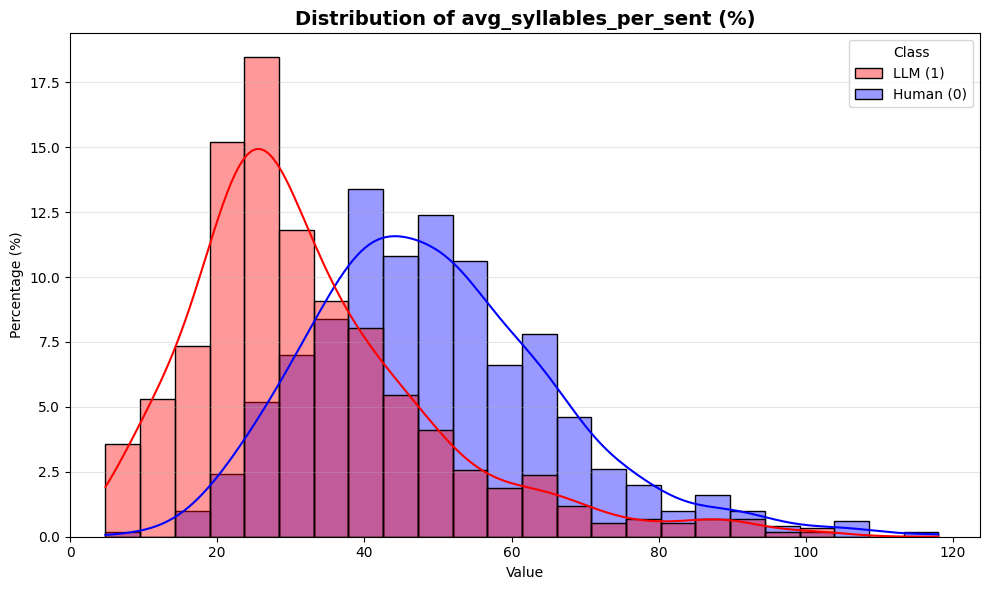

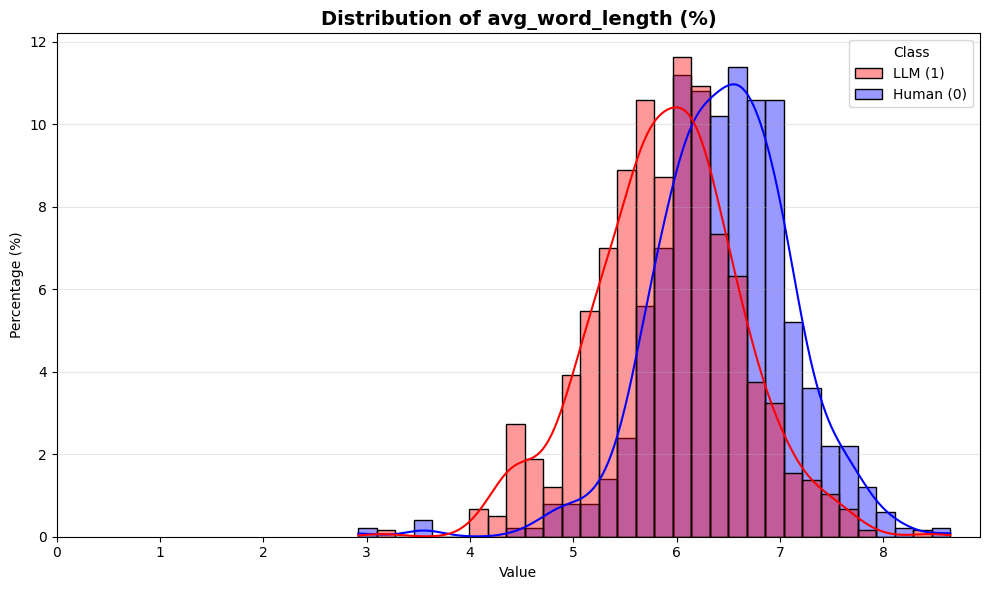

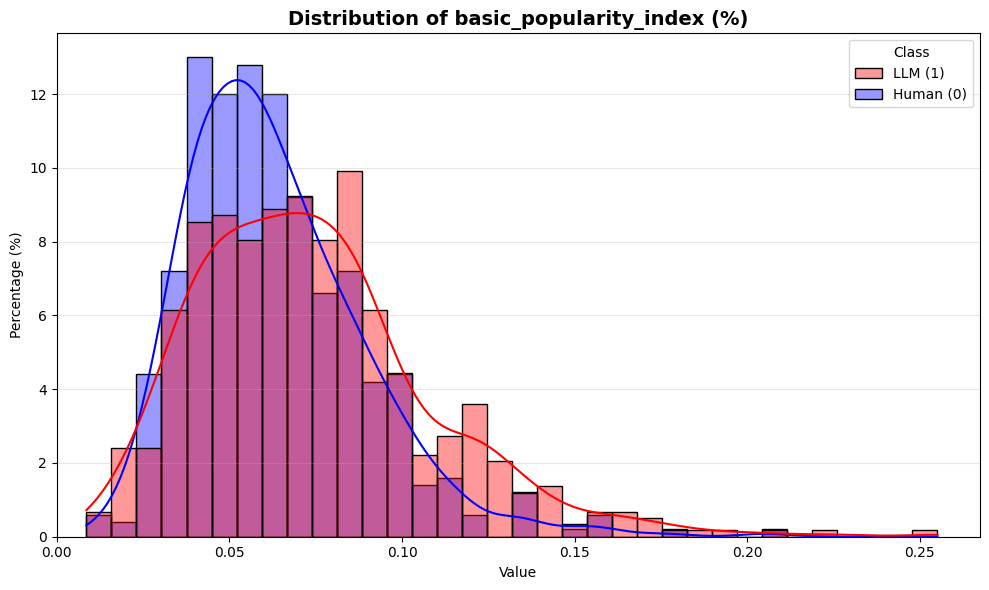

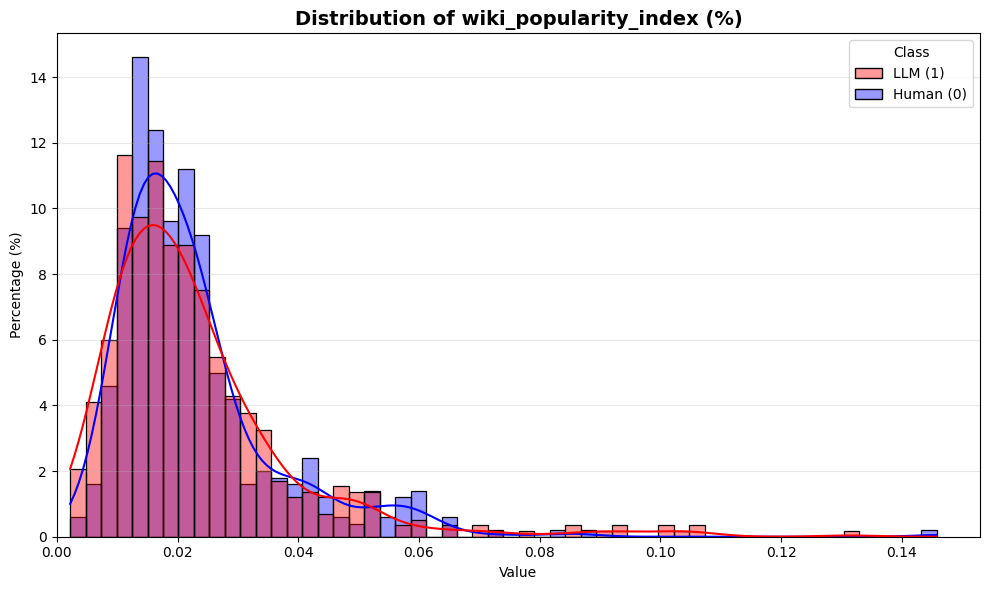

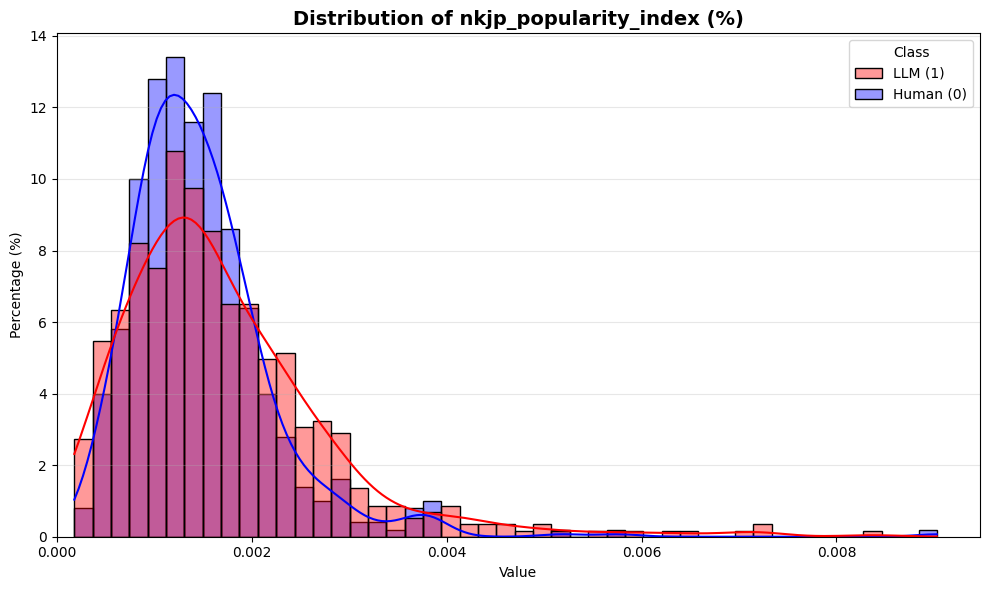

In [13]:
df_source = df[
    (df['source'] == 'gpt-oss-120b')
    | (
        (df['source'] == 'Human')
        & (df['id'].isin(df[df['source'] == 'gpt-oss-120b']['id']))
    )]
for column in df_source.columns[3:]:
    if column == 'pos_SPACE':
        continue
    if column == 'pos_SYM':
        make_plot(df_source, 'pos_SYM', (0, 0.005))
    else:
        make_plot(df_source, column)

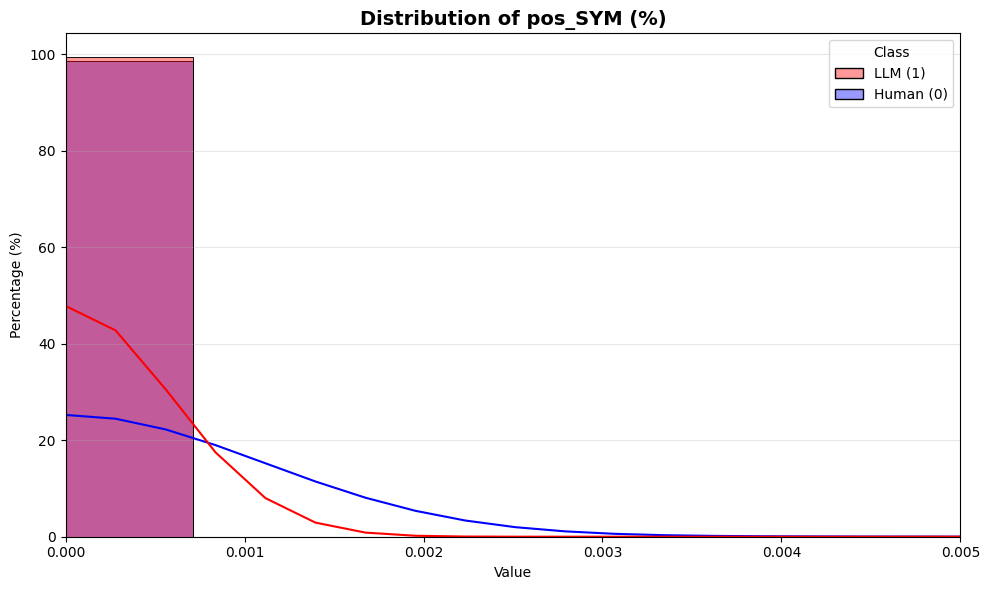

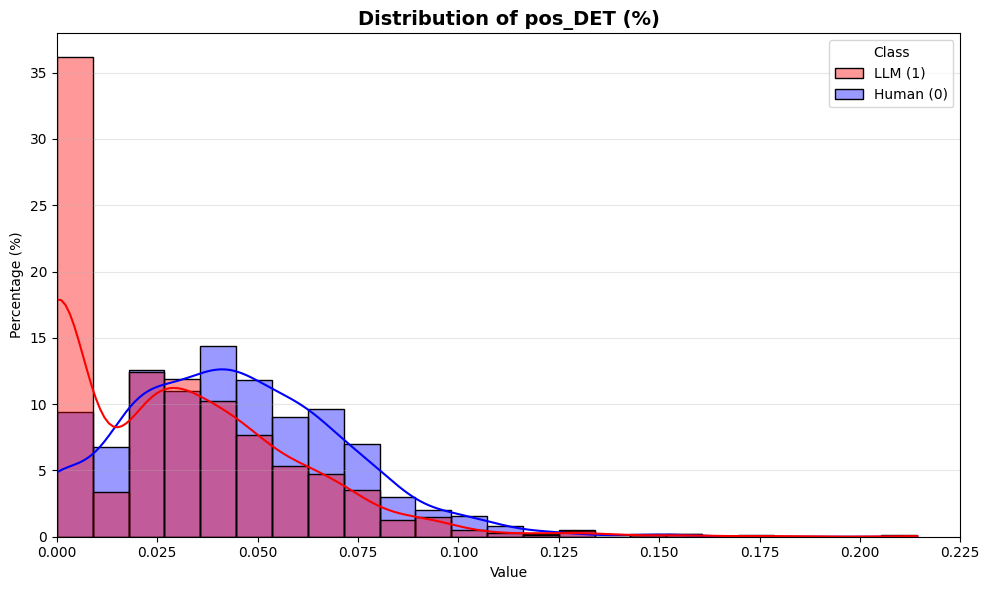

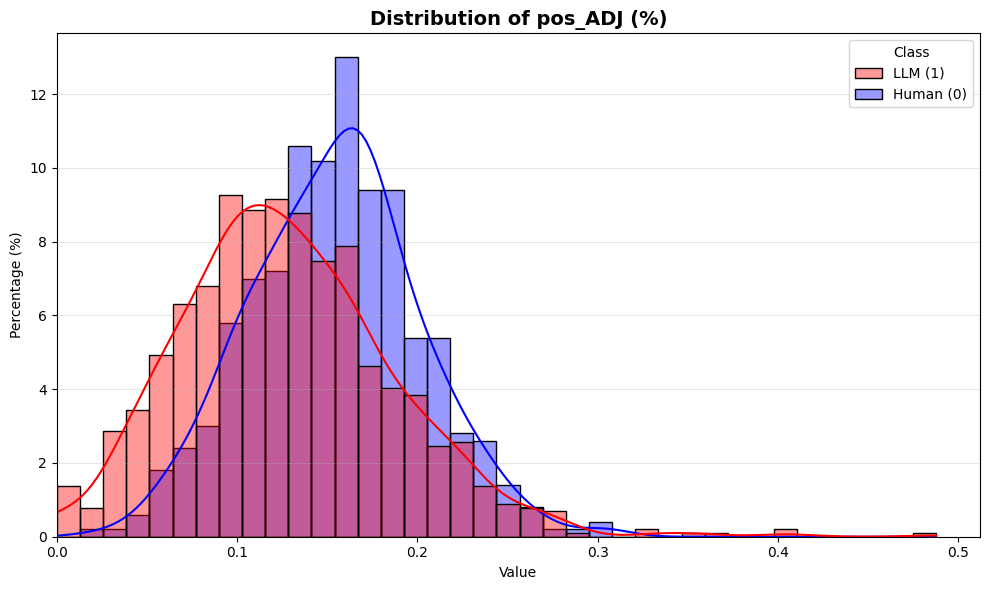

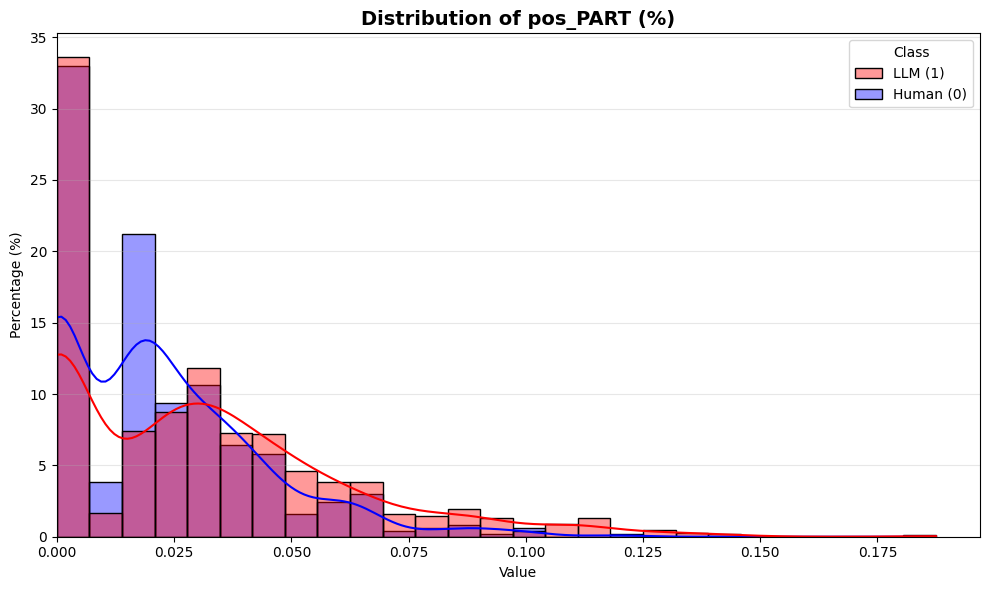

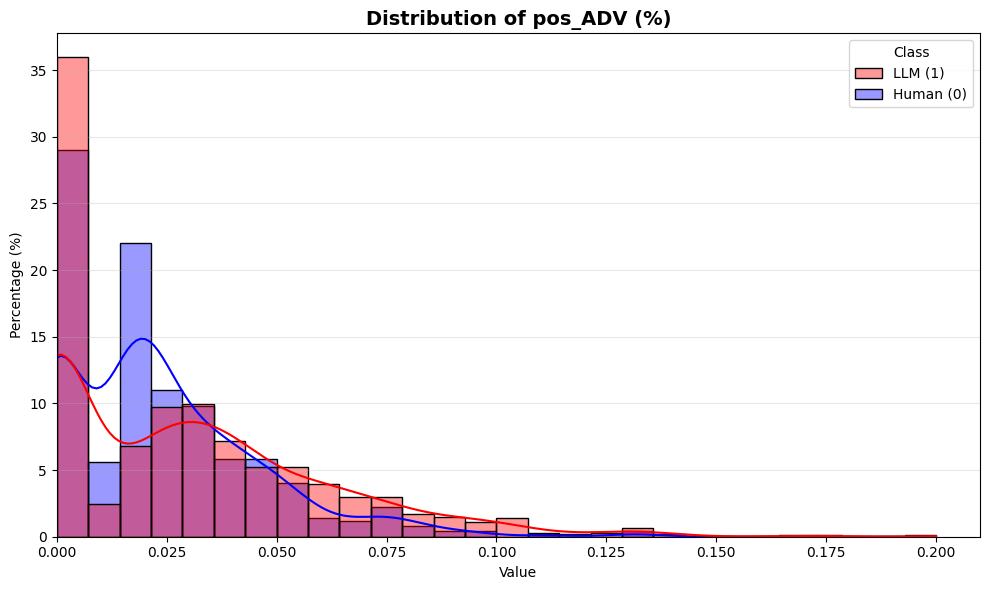

...

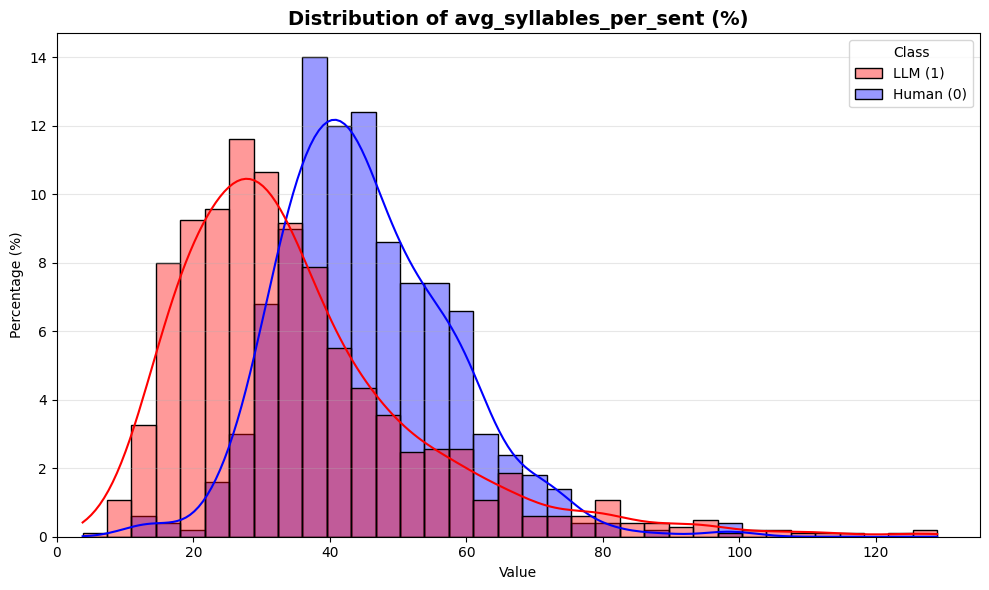

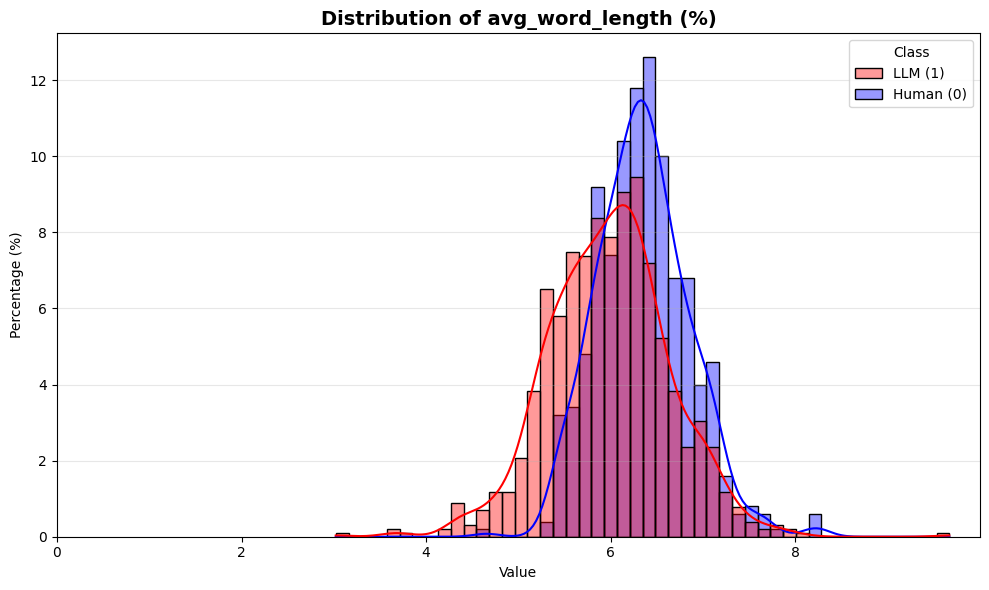

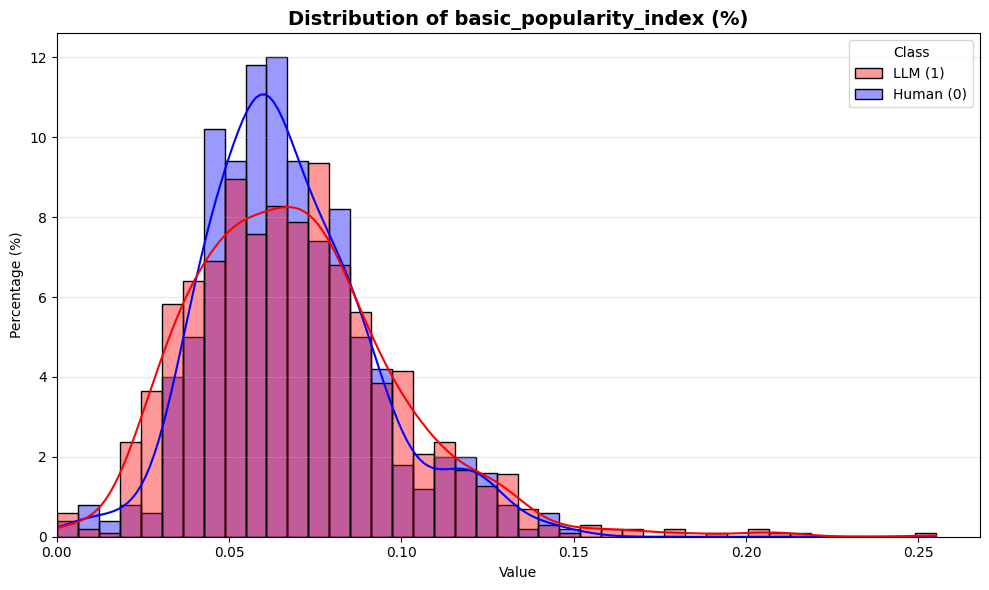

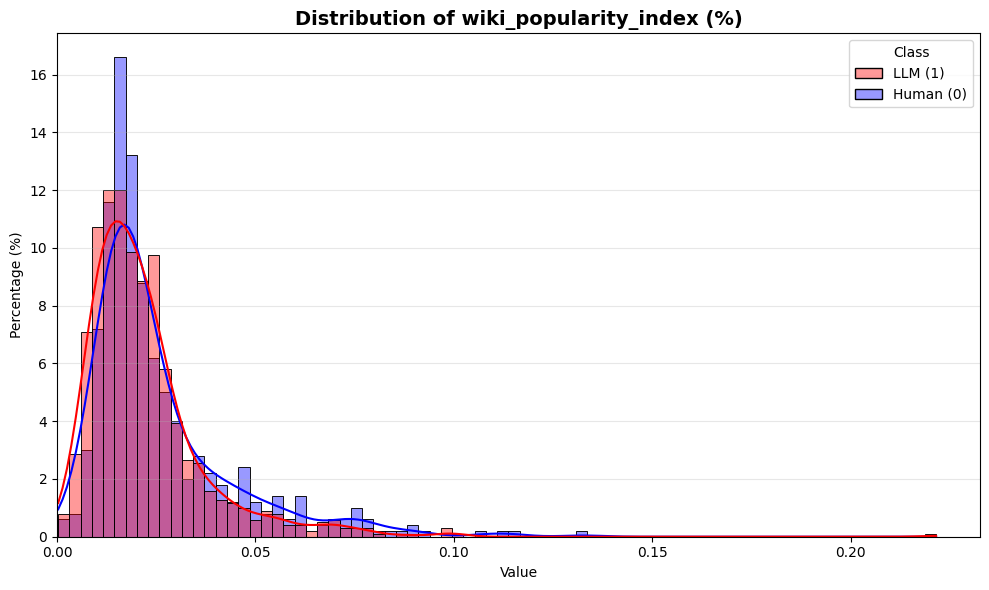

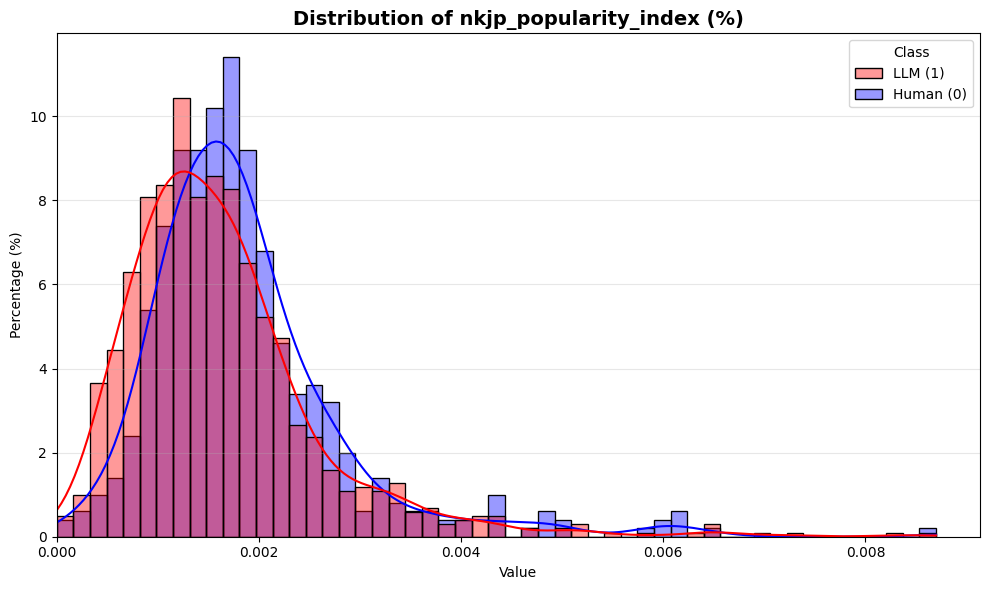

In [14]:
df_source = df[
    (df['source'] == 'llama-3.3-70b-instruct-fp8-fast')
    | (
        (df['source'] == 'Human')
        & (df['id'].isin(df[df['source'] == 'llama-3.3-70b-instruct-fp8-fast']['id']))
    )]
for column in df_source.columns[3:]:
    if column == 'pos_SPACE':
        continue
    if column == 'pos_SYM':
        make_plot(df_source, 'pos_SYM', (0, 0.005))
    else:
        make_plot(df_source, column)

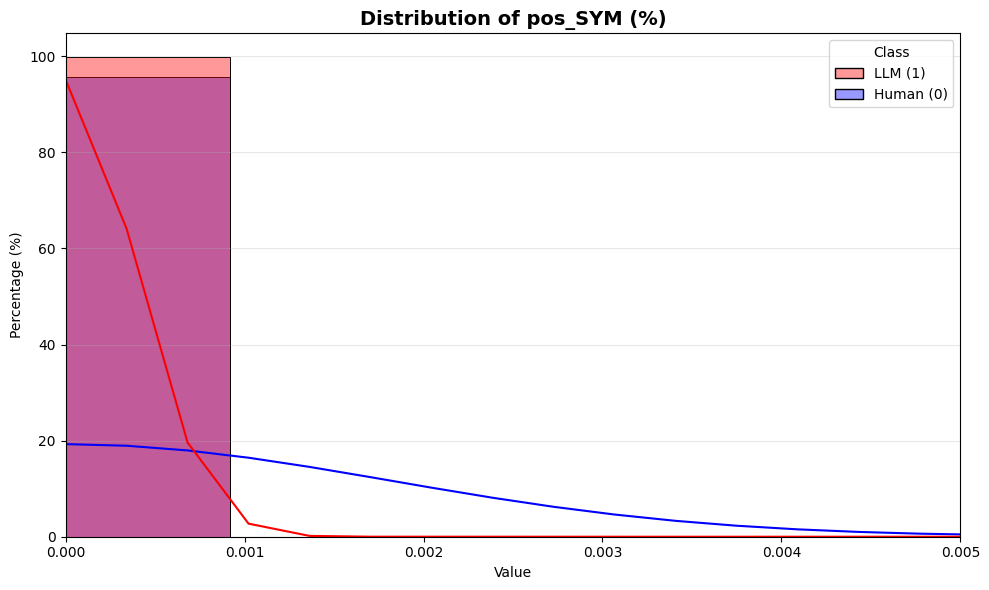

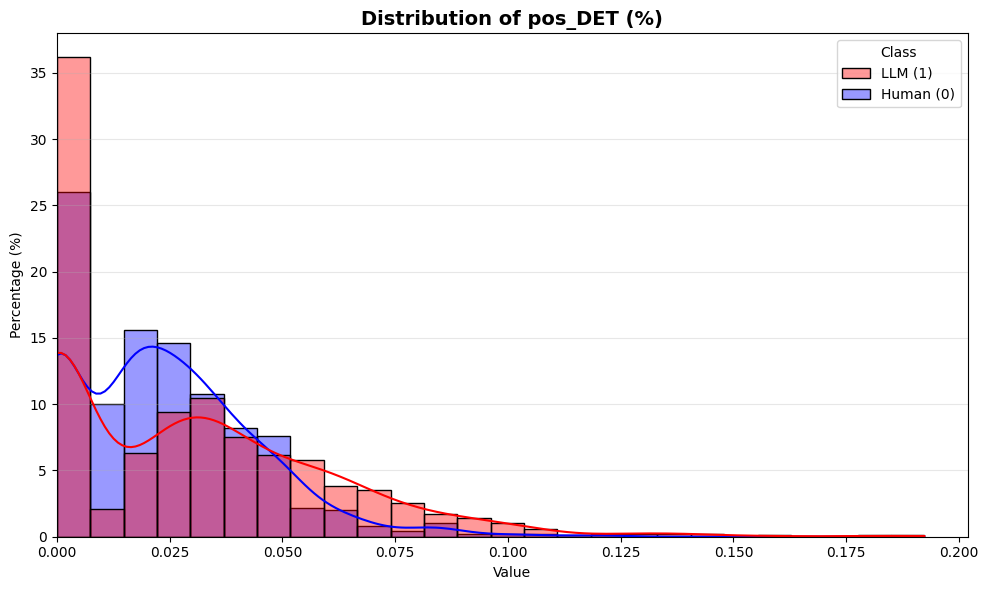

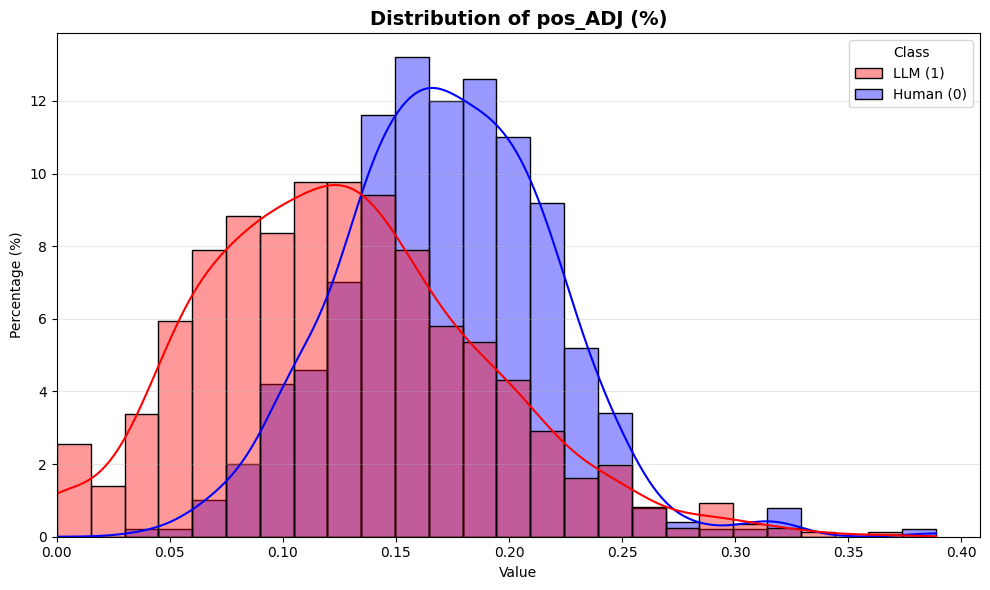

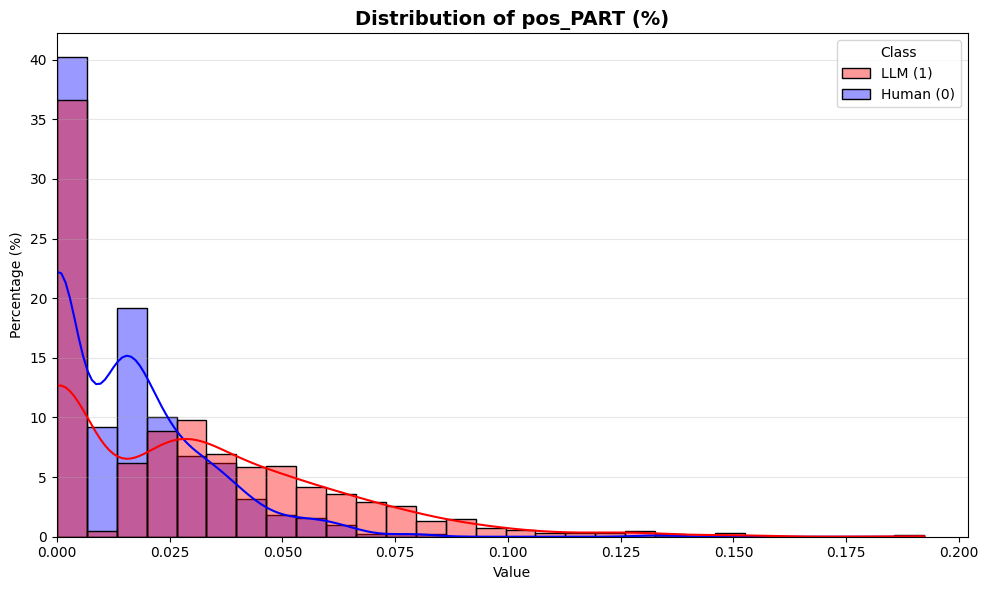

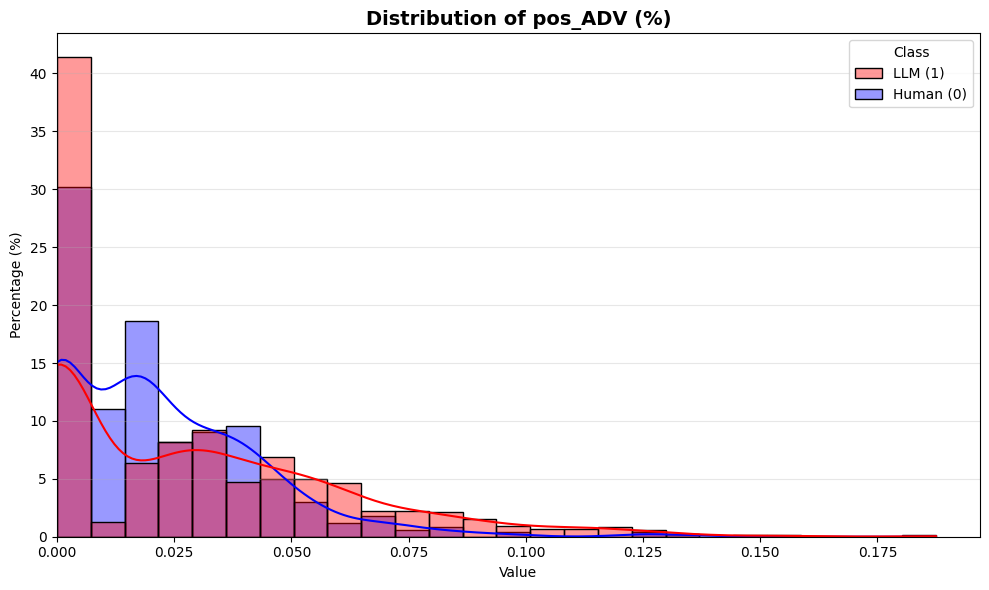

...

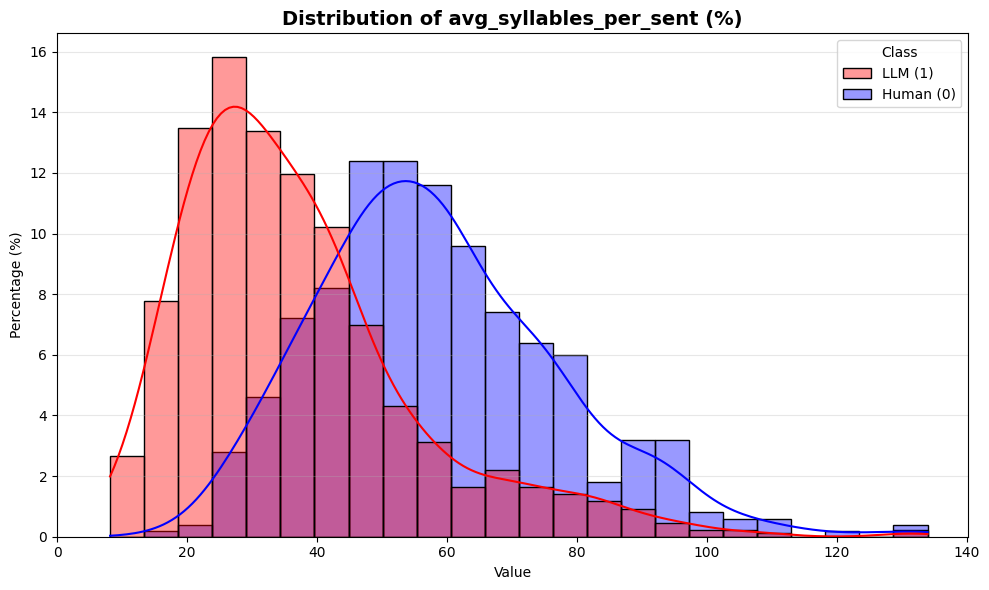

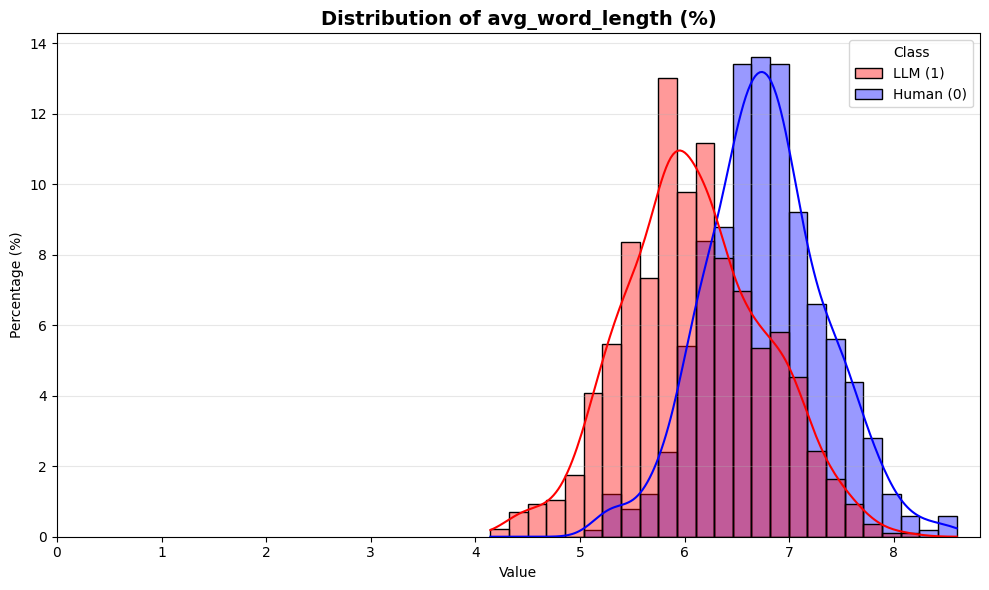

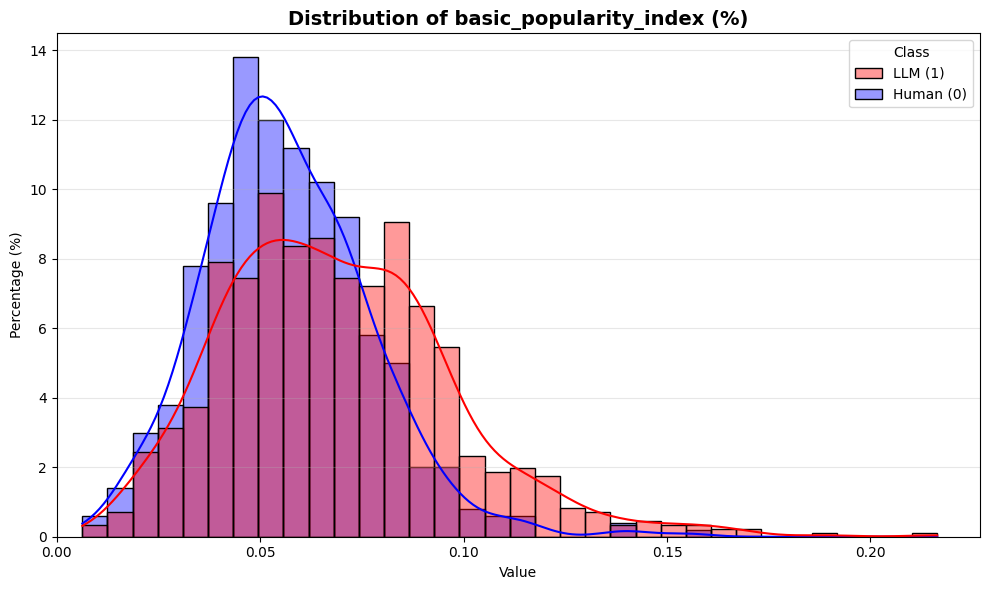

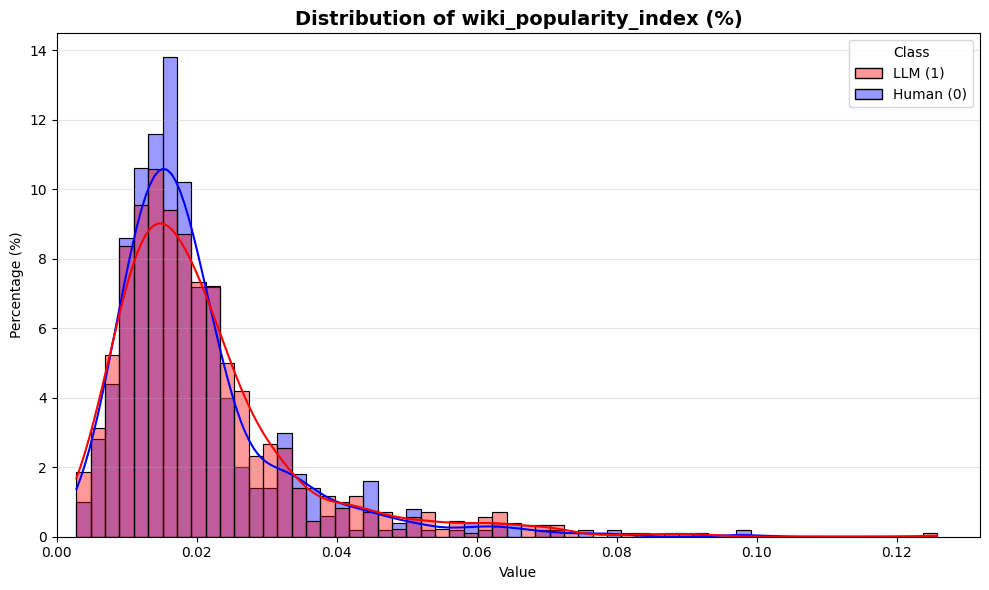

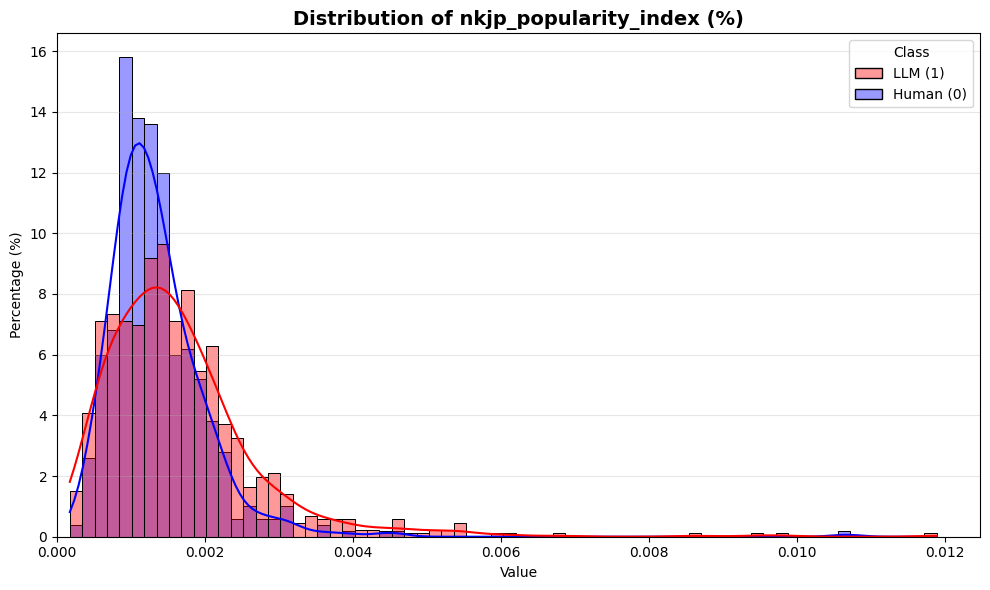

In [15]:
df_source = df[
    (df['source'] == 'nemotron-3-120b-a12b')
    | (
        (df['source'] == 'Human')
        & (df['id'].isin(df[df['source'] == 'nemotron-3-120b-a12b']['id']))
    )]
for column in df_source.columns[3:]:
    if column == 'pos_SPACE':
        continue
    if column == 'pos_SYM':
        make_plot(df_source, 'pos_SYM', (0, 0.005))
    else:
        make_plot(df_source, column)